In [1]:
#RMIT University in Vietnam
#Course: EEET2574 Big Data in Engineering
#Semester: 2020B
#Assessment: Big Data Project
#Authors: Le Dang Khoa - s3678436
#         Vu Thanh Quang -s3760192
#         Nguyen Tan Thanh - s3634815
#         Nguyen Dinh Anh Khoi - s3695517 
#Date: 27/09/2020

# AIRBNB IN LA 2019 - DATASET OVERVIEW

# Initialize urls of all datasets for loading and import libraries

In [2]:
# Import Python librarie
import pandas as pd
import numpy as np
import seaborn as sns
import sklearn as sk
import matplotlib.pyplot as plt
from datetime import datetime
from dateutil.relativedelta import relativedelta

# !pip install folium
# !pip install plotly==4.10.0
# !pip install "notebook>=5.3" "ipywidgets>=7.2"
import folium
from math import radians, cos, sin, asin, sqrt 

pd.set_option('max_columns', None)

# LOADING ASSOCIATED DATASET FOR AIRBNB IN LA 2019


In [3]:
df_LA_destinations = pd.read_csv('../Data/LAdesfilted.csv', error_bad_lines=False, index_col=0, engine='c', low_memory=False)
df_LA_groceries = pd.read_csv('../Data/LAgos.csv', error_bad_lines=False, index_col=0, engine='c', low_memory=False)
df_LA_hospitals = pd.read_csv('../Data/LAhos.csv', error_bad_lines=False, index_col=0, engine='c', low_memory=False)
df_LA_restaurants = pd.read_csv('../Data/Restaurants_in_LA.csv', error_bad_lines=False, index_col=0, engine='c', low_memory=False)
raw_df_airbnb_LA = pd.read_csv('../Data/listing_details_Airbnb_2019.csv', error_bad_lines=False, index_col=0, low_memory=False)

# Data Understainding

## Description of each column:
 This section give brief attributes' description of the understandable attribute not the entire attributes of dataset due to some attributes contain free text and url

- last_scraped - the date that the data of each listing was scraped
- availability_30 - how many nights are still available to be booked in the next 30 days
- availability_60 - how many nights are still available to be booked in the next 60 days
- availability_90 - how many nights are still available to be booked in the next 90 days
- availability_365 - how many nights are still available to be booked in the next 365 days
- experiences_offered - slightly unclear as it does not appear to directly relate to Airbnb Experiences, but this seems to be the main recommended category of travel type, e.g. business
- host_since - date that the host first joined Airbnb
- host_response_time - average amount of time the host takes to reply to messages
- host_response_rate - proportion of messages that the host replies to
- host_is_superhost - whether or not the host is a superhost, which indicates quality for the top-rated and most - experienced hosts
- host_listings_count - how many listings the host has in total
- host_identity_verified - whether or not the host has been verified with their identity
- neighbourhood_cleansed - name of neighbourhoods that each listing is located in
- property_type - type of property, e.g. house, apartment
- room_type - type of listing, e.g. entire home, private room or shared room
- accommodates - Indicate how many people a property can accommodate
- bathrooms - number of bathrooms of each listing
- bedrooms - number of bedrooms of each listing 
- beds - number of beds of each listing
- bed_type - type of bed, e.g. real bed, sofa, or couch
- amenities - list of amenities that each listing has
- price - the price per night of each listing
- security_deposit - the amount of fee charged as a security deposit
- cleaning_fee - the amount of fee charged as a cleaning fee
- guests_included - the number of guests can be included in the booking fee
- extra_people - the price per additional guest which above the number of guests can be included
- minimum_nights - the minimum nights can stay
- maximum_nights - the maximum nights can stay
- calendar_updated - when the host last updated the calendar
- number_of_reviews - The number of reviews left by people have been stayed at a property 
- number_of_reviews_ltm - the number of reviews left for the property in the last twelve months
- first_review - the date of the first review
- last_review - the date of the most recent review
- review_scores_rating - proportion of score that each property has (from 1 to 5 stars)
- review_scores_accuracy - proportion of score of the accuracy of a property's description (from 1 to 5 stars)
- review_scores_cleanliness - proportion of score of a property's cleanliness (from 1 to 5 stars)
- review_scores_checkin - proportion of score of guest's check-in  (from 1 to 5 stars)
- review_scores_communication - proportion of score a host's communication (from 1 to 5 stars)
- review_scores_location - proportion of score of a property's location (from 1 to 5 stars)
- review_scores_value - proportion of score a booking's value for money (from 1 to 5 stars)
- instant_bookable - whether or not the property can be instant booked (i.e. booked straight away, without having to message the host first and wait to be accepted)
- cancellation_policy - the type of cancellation policy of Airbnb, e.g. strict or moderate
- reviews_per_month - calculated field of the average number of reviews left by guest each month

# Data Preparation: Accessing Missing Data
Start writing your code in this section. Remember to comment and write title for each block of cells that you are working on. For names of dataframes, you can refer to the loading csv section

In [4]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
print('Airbnb in LA data shape', raw_df_airbnb_LA.shape)
print('Attribues in data', raw_df_airbnb_LA.columns.values)

Airbnb in LA data shape (564848, 106)
Attribues in data ['id' 'listing_url' 'scrape_id' 'last_scraped' 'name' 'summary' 'space'
 'description' 'experiences_offered' 'neighborhood_overview' 'notes'
 'transit' 'access' 'interaction' 'house_rules' 'thumbnail_url'
 'medium_url' 'picture_url' 'xl_picture_url' 'host_id' 'host_url'
 'host_name' 'host_since' 'host_location' 'host_about'
 'host_response_time' 'host_response_rate' 'host_acceptance_rate'
 'host_is_superhost' 'host_thumbnail_url' 'host_picture_url'
 'host_neighbourhood' 'host_listings_count' 'host_total_listings_count'
 'host_verifications' 'host_has_profile_pic' 'host_identity_verified'
 'street' 'neighbourhood' 'neighbourhood_cleansed'
 'neighbourhood_group_cleansed' 'city' 'state' 'zipcode' 'market'
 'smart_location' 'country_code' 'country' 'latitude' 'longitude'
 'is_location_exact' 'property_type' 'room_type' 'accommodates'
 'bathrooms' 'bedrooms' 'beds' 'bed_type' 'amenities' 'square_feet'
 'price' 'weekly_price' 'monthly_p

## Accessing missing data in each attribue:

### Check columns with missing values

The list below show the percentage of missing values in each attribute by using mean(), sorting in descending order
- The columns having 100% missing value are _**medium_url**,_ _**host_acceptance_rate**,_ _**xl_picture_url**,_ _**thumbnail_url**_
- The columns having 80% - 99% of missing value are _**square_feet**,_ _**license**,_ _**monthly_price**,_ _**weekly_price**_. Both _**weekly_price**,_ and _**monthly_price**_ can be dropped since they are just another measure of _**price**_. The _**square_feet**_ has 99% of missing values, hence it is also dropped
_ The other columns that have percentage of missing values in range from 19% to less than 50% can be dropped by analyzing the meaning of them in regard to the purpose of analyzing this dataset. Some of them can be worthless to keep and some can be applied the 20% missing values rule in order to consider to keep or drop

,Count missing values,Missing percentage
host_acceptance_rate,564848,100.000000
thumbnail_url,564848,100.000000
xl_picture_url,564848,100.000000
medium_url,564848,100.000000
square_feet,560498,99.229881
license,526506,93.211979
monthly_price,506502,89.670495
weekly_price,501384,88.764411
notes,280550,49.668229
access,220976,39.121321


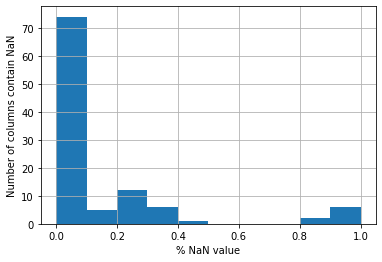

In [5]:
# Visualizing number of missing values and missing percentage in each attribute
mask = raw_df_airbnb_LA.isna()
total = mask.sum()
percent = 100 * mask.mean()
missing_data = pd.concat([total, percent], axis=1, join='outer', keys=['Count missing values', 'Missing percentage'])
missing_data.sort_values(by='Missing percentage', ascending=False, inplace=True)

nan_cols = raw_df_airbnb_LA.isna().mean().sort_values(ascending = False)
ax = nan_cols.hist()
ax.set_xlabel('% NaN value')
ax.set_ylabel('Number of columns contain NaN')
missing_data

**First feature selection by observing number of NA value in columns**
> Those columns are concerned to be dropped from the dataset for analysis were selected and justified by a common sense and normal observation from dataset. After this, we will use the Mutual Information and Autocorrelation to find important features that are feasible to analyze

- We will drop columns that have high percentage of missing values and contain only string. This consists of _**medium_url, host_acceptance_rate, xl_picture_url, thumbnail_url, square_feet, license, monthly_price, weekly_price
- _**notes, access, transit, interaction, host_about, neighborhood_overview, house_rules, jurisdiction_names, space**_. will be dropped due to these atttributes contain only string and percentage of missing values is greater than 25%
- _**scrape_id**,_ _**calendar_updated**,_ _**listing_url**,_ _**host_url**,_ _**picture_url**_ are also dropped due to the lack of contribution to the EDA for listing of Airbnb in 2019 in Los Angeles
- _**first_review and last_review**_ are also dropped because not many customers will look at the time of the first and last reviews. Instead, people are more concerned about the number of reviews of each listing.
- **zipcode** column is not used to explore the dataset. But instead, the latitude and longitude columns will be used to explore the dataset. Hence, the **zipcode** column will be dropped

### Dropping initial columns
First, all free text columns will be dropped which are not useful for predicting price (e.g url columns and other host-related features which are unrelated to the property)

In [6]:
cols_to_drop = [
    'host_acceptance_rate', 'zipcode', 'square_feet', 'license', 'monthly_price',
    'weekly_price', 'jurisdiction_names', 'first_review', 'last_review',
    'listing_url', 'scrape_id', 'name', 'summary', 'space',
    'description', 'neighborhood_overview', 'notes', 'transit', 'access',
    'interaction', 'house_rules', 'thumbnail_url', 'medium_url', 'picture_url',
    'xl_picture_url', 'host_id', 'host_url', 'host_name', 'host_location',
    'host_about', 'host_thumbnail_url', 'host_picture_url',
    'host_neighbourhood', 'host_verifications', 'calendar_last_scraped']

df_airbnb_LA = raw_df_airbnb_LA.drop(cols_to_drop, axis=1)

# The id columns will be used as the index, it could be useful in the future
# e.g. if a separate dataset containing reviews for each property is linked to this one
# df_airbnb_LA.set_index('id', inplace=True)

In [7]:
df_airbnb_LA.isna().sum().sort_values(ascending=False)

security_deposit                                139635
host_response_time                              119082
host_response_rate                              119082
review_scores_value                             117525
review_scores_location                          117424
review_scores_checkin                           117355
review_scores_communication                     117052
review_scores_accuracy                          117001
review_scores_cleanliness                       116995
review_scores_rating                            116765
reviews_per_month                               109522
cleaning_fee                                     76387
neighbourhood                                    31935
market                                             870
beds                                               722
host_identity_verified                             607
host_total_listings_count                          607
host_has_profile_pic                               607
host_since

**Neighbourhood attributes**
>There are many columns for property location. Some of these columns can be dropped because the listings are in Los Angeles; hence, columns relating to country should be dropped. 
The column for area (borough) is kept which is 'neighbourhood_cleansed'

- _**neighbourhood**,_ has 5.7% missing values whereas _**neighbourhood_cleansed**,_ has zero missing values. Besides, _**neighbourhood**_ attribute has 532913 rows contain same value with _**neighbourhood_cleansed**_. Therefore, we will use the _**neighbourhood_cleansed**,_ and drop the _**neighbourhood**_.
- _**neighbourhood_group_cleansed**_ is about the city of that neighbourhood and it is not necessary in analyzing; hence, we will drop this column

In [8]:
print(f"The proportion of NaN in neighbourhood column is: " 
      f"{round(df_airbnb_LA['neighbourhood'].isna().mean() * 100, 1)}%")

neighbourhood_columns = ['neighbourhood', 'neighbourhood_cleansed', 'neighbourhood_group_cleansed']
filtered_neighbourhood_df = df_airbnb_LA.loc[:, df_airbnb_LA.columns.isin(neighbourhood_columns)]
filtered_neighbourhood_df.head(20)

The proportion of NaN in neighbourhood column is: 5.7%


,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed
0,Culver City,Culver City,Other Cities
1,Burbank,Burbank,Other Cities
2,NaN,Hollywood,City of Los Angeles
3,Santa Monica,Santa Monica,Other Cities
4,Bellflower,Bellflower,Other Cities
5,Laurel Canyon,Hollywood Hills West,City of Los Angeles
6,Del Rey,Del Rey,City of Los Angeles
7,Del Rey,Del Rey,City of Los Angeles
8,Del Rey,Del Rey,City of Los Angeles
9,Woodland Hills/Warner Center,Woodland Hills,City of Los Angeles


In [9]:
neighbourhood_attribute_counts =filtered_neighbourhood_df['neighbourhood'].value_counts().to_frame('counts').rename_axis('neighbourhood').reset_index()
neighbourhood_cleansed_attribute_counts =filtered_neighbourhood_df['neighbourhood_cleansed'].value_counts().to_frame('counts').rename_axis('neighbourhood_cleansed').reset_index()

In [10]:
neighbourhood_attribute_counts['counts'].sum()

532913

In [11]:
 neighbourhood_cleansed_attribute_counts['counts'].sum()

564848

In [12]:
df_airbnb_LA.drop([
    'street','state','market', 'smart_location',
    'country_code', 'country', 'is_location_exact',
    'neighbourhood_group_cleansed', 'neighbourhood'], axis=1, inplace=True)

In [13]:
# Initialize functions

def annotated_heatmap(initial_df, filtered_cols, heatmap_title):
    filtered_df = initial_df.loc[:, initial_df.columns.isin(filtered_cols)]
    filtered_df_corr = filtered_df.corr(method = 'spearman')
    mask = np.triu(np.ones_like(filtered_df_corr, dtype = np.bool))
    
    fig, ax = plt.subplots(1, 1, figsize=(16,10))
    sns.heatmap(filtered_df_corr, mask=mask, annot=True, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1, cbar_kws={'shrink':.8})
    plt.title(heatmap_title, fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14, va='center')
    
def plot_categorical(df, x_val, hue=None, corlor_map='Set', figsize=(16,10)):
    fig, ax = plt.subplots(figsize=figsize)
    countplot = sns.countplot(x=x_val, hue=hue, data=df, palette=color_map)
    ax.set_title(f'Count plot for {x_val}')
    ax.grid(True)
    
def label_encoding(df, col, bins, labels, na_label='missing'):
    """
    Takes a column, and segment continuous data into discrete bins with group of 
    labels and fill the na value of the column according to na_label
    
    Argument
    ========
    df: pandas dataframe
    col: str, column of dataframe
    bins: int, the criteria to bin by
    labels: arrays, specify labels for the returned bins
    na_label: values to replace missing values in col
    
    Returns
    """
    
    if df[col].dtype == 'O':
        df[col] = df[col].str[:-1].astype('float64')
        
    df[col] = pd.cut(df[col], bins=bins, labels=labels, include_lowest=True)
    df[col] = df[col].astype('str')

**Second feature selection by using correlation**
- There are _**minimum_nights**,_ _**maximum_nights**,_ _**minimum_minimum_nights**,_ _**maximum_minimum_nights**,_ _**minimum_maximum_nights**,_ _**maximum_maximum_nights**,_ _**minimum_nights_avg_ntm**,_ _**maximum_nights_avg_ntm**,_ and _**host_listing_count**,_ _**host_total_listing_count**,_ _**calculated_host_listings_count**,_ _**calculated_host_listings_count_entire_homes**_ are quite hard to see the relationship. Hence, we will use the correlation value to decide which attributes to keep and be dropped.

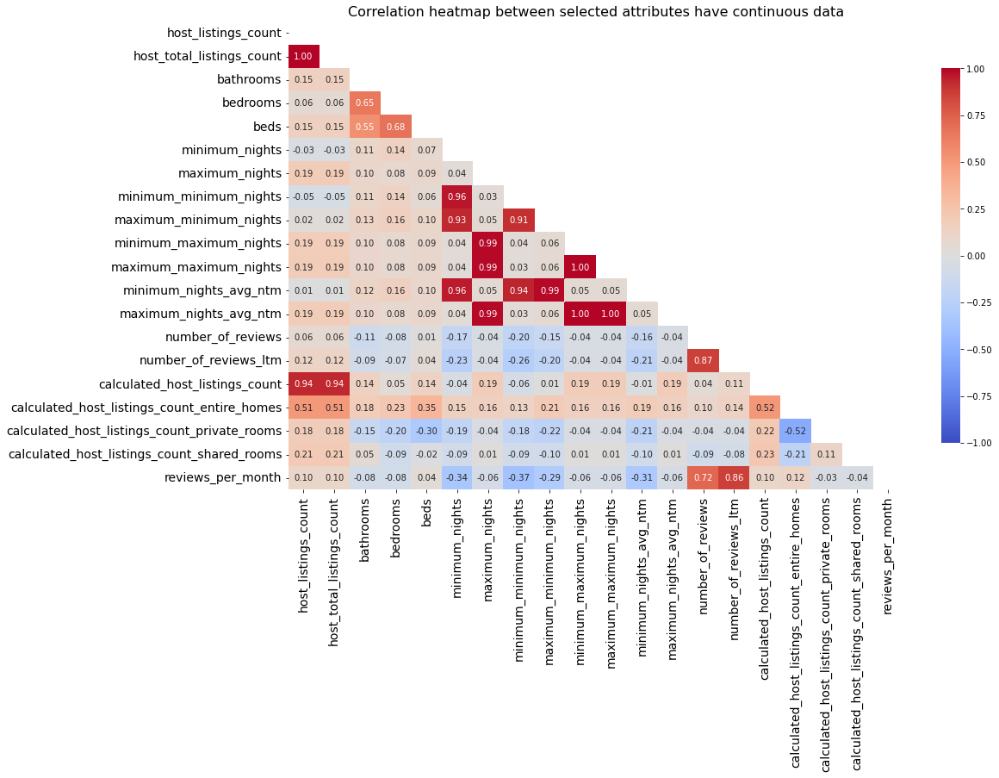

In [14]:
columns_filtered = ['bedrooms', 'beds', 'bathrooms', 'minimum_nights', 'maximum_nights',
              'minimum_minimum_nights', 'maximum_minimum_nights',
              'minimum_maximum_nights', 'maximum_maximum_nights',
              'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
              'host_listings_count', 'host_total_listings_count',
              'number_of_reviews', 'number_of_reviews_ltm', 'reviews_per_month',
              'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 
              'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms']

annotated_heatmap(df_airbnb_LA, columns_filtered, 'Correlation heatmap between selected attributes have continuous data')

In [15]:
print(sum((df_airbnb_LA['minimum_nights'] == df_airbnb_LA['minimum_minimum_nights']) == False))

23672


In [16]:
print(sum((df_airbnb_LA['maximum_nights'] == df_airbnb_LA['maximum_maximum_nights']) == False))

4440


**Observation from the correlation heatmap**
> There are few differences between minimum_nights and minimum_minimum_nights and also for maximum_nights and maximum_maximum_nights. Hence, we will retain min/max nights columns and drop other columns related to min/max nights

- _**minimum_nights**_ has high correlated with _**minimum_nights_avg_ntm, maximum_minimum_nights**_ and _**minimum_minimum_nights**_. 
- _**maximum_nights**_ does not have any correlation with other min/max nights attributes. 
>Hence, we will retain _**minimum_nights**, and **maximum_nights**,_ and drop _**minimum_minimum_nights, maximum_minimum_nights, minimum_maximum_nights, maximum_maximum_nights, minimum_nights_avg_ntm, maximum_nights_avg_ntm**_. 

- _**host_listing_count**_ has high correlated with _**host_total_listing_count**,_ _**calculated_host_listings_count**,_ _**calculated_host_listings_count_entire_homes**_. Hence, we will keep the _**host_listing_counts**_ and drop the _**host_total_listing_count, calculated_host_listings_count, calculated_host_listings_count_entire_homes**_

- _**bedrooms, bathrooms,**_ and _**beds**_ has correlated with each other. Hence, we will not drop any of them

- _**calculated_host_listings_count_entire_homes**,_ _**calculated_host_listings_count_private_rooms**,_ _**calculated_host_listings_count_shared_rooms**,_ have very low positive and negative correlation with other attributes. Hence, these columns can be dropped
- _**number_of_reviews_ltm**_ and _**reviews_per_month**_ are highly correlated with _**number_of_reviews**_. Therefore, we will dropped those 2 columns and keep _**number_of_reviews**_

The columns _**host_listings_count**_ and _**host_total_listings_count**_ have 607 rows that have different values. These different cases are those where the value of both columns is NaN. The remaining rows are identical in value. 

In [17]:
print(f"Number of NaN values in host_listings_count column is: " 
      f"{(df_airbnb_LA['host_listings_count'].isna().sum())}")
print(f"Number of NaN values in host_total_listings_count column is: " 
      f"{(df_airbnb_LA['host_total_listings_count'].isna().sum())}")
print(f"Number of different rows between host_listings_count and host_total_listings_count: "
      f"{(sum((df_airbnb_LA['host_listings_count'] == df_airbnb_LA['host_total_listings_count']) == False))}")

Number of NaN values in host_listings_count column is: 607
Number of NaN values in host_total_listings_count column is: 607
Number of different rows between host_listings_count and host_total_listings_count: 607


In [18]:
df_airbnb_LA.drop([
    'host_total_listings_count', 'calculated_host_listings_count',
    'number_of_reviews_ltm', 'reviews_per_month',
    'calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms',
    'calculated_host_listings_count_shared_rooms','minimum_minimum_nights', 'maximum_minimum_nights',
    'minimum_maximum_nights', 'maximum_maximum_nights','minimum_nights_avg_ntm',
    'maximum_nights_avg_ntm'], axis=1, inplace=True)

**Checking whether boolean and categorical attributes contain sufficient numbers of instances in each category to make them worth including**

<ipython-input-19-f50cc5aa4f72>:6: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  df_airbnb_LA.hist(ax=ax)


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000021854384B80>,
      dtype=object)

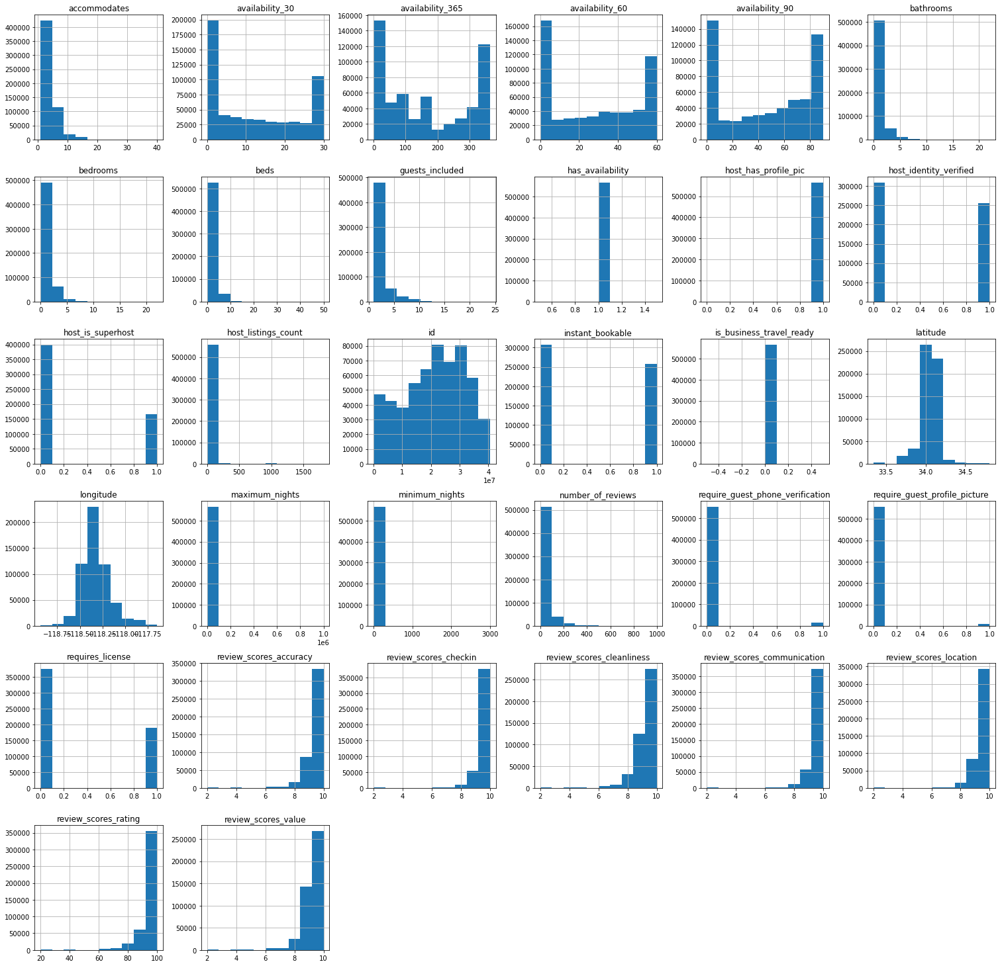

In [19]:
# Replacing columns with f/t with 0/1
df_airbnb_LA.replace({'f': 0, 't': 1}, inplace=True)

# Plotting the distribution of numerical and boolean categories
fig, ax = plt.subplots(figsize=(26,26))
df_airbnb_LA.hist(ax=ax)

From the graphs above, we will concentrate on graphs that have x-values ranging from 0 to 1 due to those value indicates for categorical values _**t**_ as 1, and _**f**_ as 0. It can be seen that there are several columns contain only one categorical value. Hence, they can be dropped

In [20]:
df_airbnb_LA.drop([
    'has_availability', 'host_has_profile_pic', 'is_business_travel_ready',
    'require_guest_phone_verification', 'require_guest_profile_picture'], axis=1, inplace=True)

## Cleaning individual columns

**availability columns**

- _**availability_365**_ are highly correlated with _**availability_30**,_ _**availability_60**,_ and _**availability_90**_. Therefore, one column is needed to keep. Additionally, according to the Los Angeles, CA Airbnb's regulation and local laws in LA, the maximum of nights of hosting guest for maximum 120 nights. Additionally, the hosts can register for home-sharing more than 120 nights according to the LA local laws. Thus, the _**availability_365**_ is kept.
- **Reference link**: https://www.airbnb.com/help/article/864/los-angeles-ca#:~:text=Based%20on%20Home%20Sharing%20Ordinance,to%20comply%20with%20the%20ordinance.

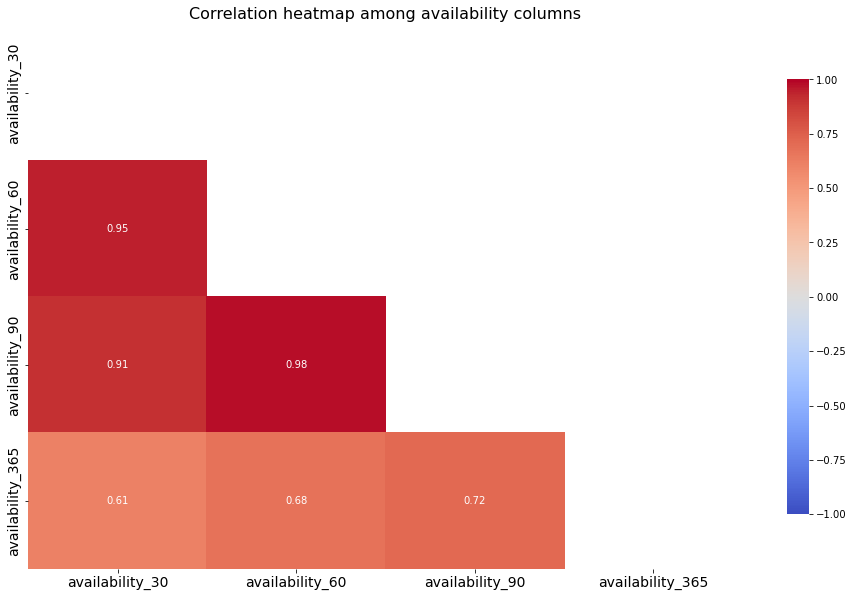

In [21]:
availability_columns = ['availability_30', 'availability_60', 'availability_90', 'availability_365']
annotated_heatmap(df_airbnb_LA, availability_columns, 'Correlation heatmap among availability columns')

In [22]:
df_airbnb_LA.drop(['availability_30', 'availability_60', 'availability_90'], axis=1, inplace=True)

**experiences_offered column**
- The experiences_offered column contains only categorical value which is _'none'_. That means most of the listings offered no experiences. So, it is not necessarily to keep and can be dropped.

In [23]:
# Using normalize = True to see the relative frequencies of unique values
# 1.0 mean 100% number of rows in the column 'experiences_offered' contain only 'none'
df_airbnb_LA['experiences_offered'].value_counts(normalize=True)

none    1.0
Name: experiences_offered, dtype: float64

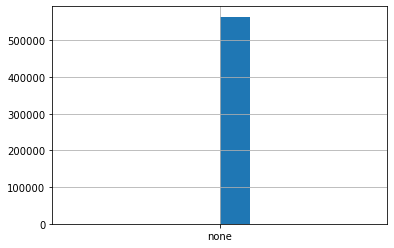

In [24]:
df_airbnb_LA['experiences_offered'].hist()

In [25]:
df_airbnb_LA.drop('experiences_offered', axis=1, inplace=True)

**hot_since column**
- _**hot_since**_ is a datetime column, hence the column will be converted to the datetime

In [26]:
df_airbnb_LA['host_since'] = pd.to_datetime(df_airbnb_LA['host_since'])

**hot_response_time**

In [27]:
print("Null values:", df_airbnb_LA['host_response_time'].isna().sum())
print(f"Proportion: {round((df_airbnb_LA['host_response_time'].isna().mean())*100, 1)}%")

Null values: 119082
Proportion: 21.1%


In [28]:
# df_airbnb_LA['host_response_time'].fillna("missing", inplace=True)
df_airbnb_LA.dropna(subset=['host_response_time'], how = 'any', inplace=True)
df_airbnb_LA.reset_index(drop=True,inplace=True)
df_airbnb_LA['host_response_time'].value_counts(normalize=True)

within an hour        0.728108
within a few hours    0.156670
within a day          0.089397
a few days or more    0.025825
Name: host_response_time, dtype: float64

**host_response_rate**

The dtype of column _**host_response_rate**_ is as _object_. This is because it contains _%_ sign in the value. Therefore, we will remove the _%_ sign from the data

In [29]:
df_airbnb_LA['host_response_rate'].dtypes

dtype('O')

In [30]:
# Removing the % sign from the host_response_rate string and converting to a float
df_airbnb_LA['host_response_rate'] = df_airbnb_LA['host_response_rate'].str[:-1].astype('float64')

In [31]:
df_airbnb_LA['host_response_rate'].dtypes

dtype('float64')

In [32]:
print("Null values:", df_airbnb_LA['host_response_rate'].isna().sum())
print(f"Proportion: {round((df_airbnb_LA['host_response_rate'].isna().mean())*100, 1)}%")

print("Mean host response rate:", round(df_airbnb_LA['host_response_rate'].mean(),0))
print("Median host response rate:", df_airbnb_LA['host_response_rate'].median())
print(f"Proportion of 100% host response rates:"
      f"{round(((df_airbnb_LA['host_response_rate'] == 100.0).sum()/df_airbnb_LA['host_response_rate'].count())*100,1)}%")

Null values: 0
Proportion: 0.0%
Mean host response rate: 95.0
Median host response rate: 100.0
Proportion of 100% host response rates:71.9%


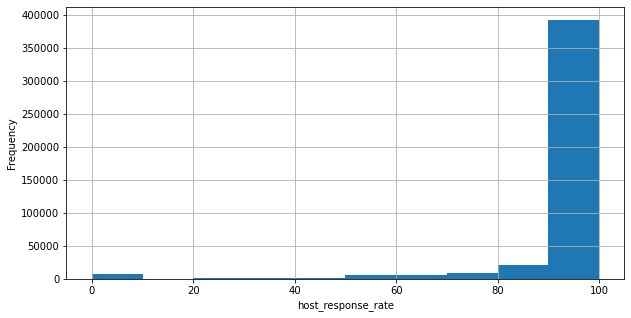

In [33]:
fig, ax = plt.subplots(figsize=(10, 5))
df_airbnb_LA['host_response_rate'].hist(bins=10, ax=ax)
ax.set_xlabel('host_response_rate')
ax.set_ylabel('Frequency');

In [34]:
# Bin into four categories
# df_airbnb_LA['host_response_rate'] = pd.cut(df_airbnb_LA['host_response_rate'], bins=[0, 50, 90, 99, 100], 
#                                             labels=['0-49%', '50-89%', '90-99%', '100%'], include_lowest=True)
df_airbnb_LA.dropna(subset=['host_response_rate'], how = 'any', inplace=True)
df_airbnb_LA.reset_index(drop=True,inplace=True)

df_airbnb_LA['host_response_rate_encoded'] = df_airbnb_LA['host_response_rate']

# Converting to string
df_airbnb_LA['host_response_rate_encoded'] = df_airbnb_LA['host_response_rate'].astype('str')

#label encoding for categorize host response ratio into ranges
label_encoding(df_airbnb_LA, 'host_response_rate_encoded', bins=[0, 50, 75, 90, 100], 
               labels = ['0-49%', '50-74%','75-89%', '90-100%'])

**host_is_superhost**

In [35]:
# Number of rows without a value for multiple host-related columns
len(df_airbnb_LA[df_airbnb_LA.loc[:,['host_since', 'host_is_superhost', 'host_listings_count',
                                     'host_identity_verified']].isna().sum(axis=1) == 4])

0

In [36]:
df_airbnb_LA.dropna(subset=['host_since', 'host_is_superhost', 
                            'host_listings_count', 'host_identity_verified'], inplace=True)

In [37]:
len(df_airbnb_LA[df_airbnb_LA.loc[:,['host_since', 'host_is_superhost', 'host_listings_count',
                                     'host_identity_verified']].isna().sum(axis=1) == 4])

0

**property_type**

In [38]:
# Replacing categories that are types of houses or apartments
df_airbnb_LA['property_type'].replace({
    'Townhouse': 'House',
    'Serviced apartment': 'Apartment',
    'Loft': 'Apartment',
    'Bungalow': 'House',
    'Cottage': 'House',
    'Villa': 'House',
    'Tiny house': 'House',
    'Earth house': 'House',
    'Chalet': 'House'}, inplace=True)

# Replacing other categories with 'other'
df_airbnb_LA.loc[~df_airbnb_LA['property_type'].isin(['House', 'Apartment']), 'property_type'] = 'Other'

**bedtype**

Most listings have the same bed type of _**Real Bed**_. But we will keep this attribute in case we use it for analyzing 

In [39]:
df_airbnb_LA['bed_type'].value_counts()

Real Bed         441875
Futon              1628
Pull-out Sofa      1187
Airbed              722
Couch               354
Name: bed_type, dtype: int64

**beds, bedrooms and bathrooms**

For missing values in these 3 columns, we will drop rows that contain na value in these columns

In [40]:
df_airbnb_LA['beds'].isna().sum()

365

In [41]:
df_airbnb_LA['bedrooms'].isna().sum()

377

In [42]:
df_airbnb_LA['bathrooms'].isna().sum()

145

In [43]:
df_airbnb_LA.dropna(subset=['beds', 'bedrooms','bathrooms'], how = 'any', inplace=True)

_**amenities**_

In [44]:
df_airbnb_LA['amenities'] = df_airbnb_LA['amenities'].str.replace("[{}]", "").str.replace('"', "")

In [45]:
# Example of amenities listed after remove superfluous characters
df_airbnb_LA['amenities'].values

array(['TV,Cable TV,Internet,Wifi,Air conditioning,Pool,Kitchen,Pets live on this property,Dog(s),Free street parking,Heating,Family/kid friendly,Washer,Dryer,Smoke detector,Carbon monoxide detector,First aid kit,Essentials,Shampoo,24-hour check-in,Hangers,Hair dryer,Iron,Laptop friendly workspace,Children’s books and toys,Fireplace guards,Children’s dinnerware,Hot water,Microwave,Coffee maker,Refrigerator,Dishwasher,Dishes and silverware,Cooking basics,Oven,Stove,Single level home,BBQ grill,Patio or balcony,Luggage dropoff allowed,Other',
       'Internet,Wifi,Air conditioning,Wheelchair accessible,Kitchen,Free parking on premises,Gym,Breakfast,Elevator,Free street parking,Hot tub,Buzzer/wireless intercom,Heating,Washer,Dryer,Smoke detector,Carbon monoxide detector,First aid kit,Safety card,Fire extinguisher,Essentials,Shampoo,24-hour check-in,Hangers,Hair dryer,Iron,Laptop friendly workspace,translation missing: en.hosting_amenity_49,translation missing: en.hosting_amenity_50,Hot wat

**Review scores columns**
- From the correlation heatmap between review scores columns. It can be seen that all review scores columns are highly correlated to each other. However, we will only interested in the review_scores_rating which will reflect the rating of reviews for listings. Therefore, we will drop other columns and keep only review_scores_rating column

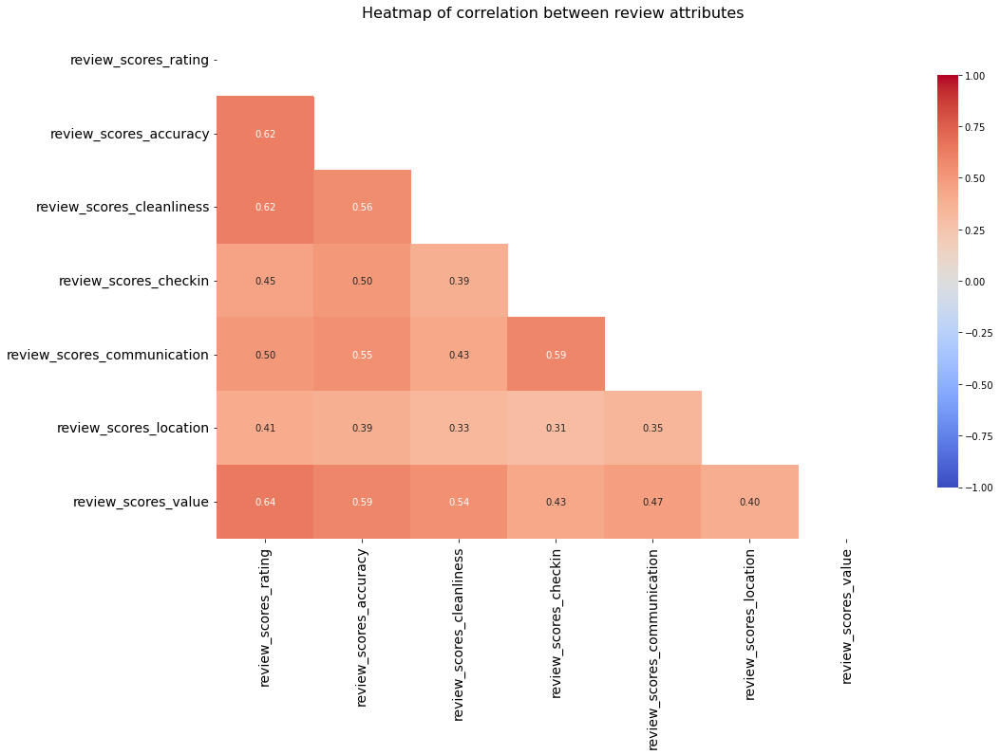

In [46]:
review_columns = ['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
                  'review_scores_communication', 'review_scores_checkin', 'review_scores_location', 'review_scores_value']
annotated_heatmap(df_airbnb_LA, review_columns, 'Heatmap of correlation between review attributes ')

In [47]:
review_colmns_to_drop = ['review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_value',
                         'review_scores_communication', 'review_scores_checkin', 'review_scores_location']
df_airbnb_LA.drop(review_colmns_to_drop, axis=1, inplace = True)

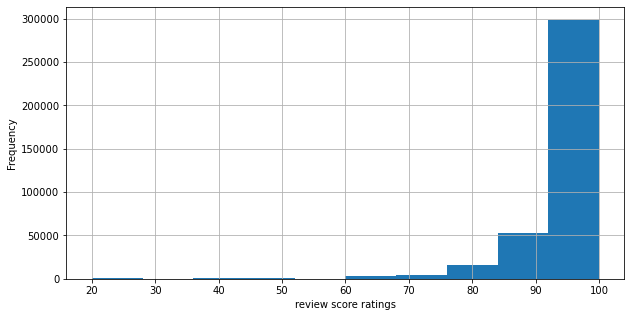

In [48]:
fig, ax = plt.subplots(figsize=(10, 5))
df_airbnb_LA['review_scores_rating'].hist(bins=10, ax=ax)
ax.set_xlabel('review score ratings')
ax.set_ylabel('Frequency');

In [49]:
df_airbnb_LA['review_scores_rating'].isna().sum()

68034

In [50]:
df_airbnb_LA.dropna(subset=['review_scores_rating'], how='any', inplace=True)

In [51]:
df_airbnb_LA['review_scores_rating_encoded'] = df_airbnb_LA['review_scores_rating']
label_encoding(df_airbnb_LA, 'review_scores_rating_encoded', bins=[0, 80, 90, 100], 
               labels = ['0-79%', '80-89%', '90-100%'], na_label='no reviews')

**security_deposit**
- As with price, the data in _**security_deposit**_ has currency sign. Hence, the data in this column will be converted to int
- Having a missing value for security deposit is functionally the same as having a security deposit of 0 dollar, so missing values will be imputed with 0.

In [52]:
df_airbnb_LA['security_deposit'].isna().sum()

66110

In [53]:
df_airbnb_LA['security_deposit'] = df_airbnb_LA['security_deposit'].str.lstrip('$')
df_airbnb_LA['security_deposit'] = df_airbnb_LA['security_deposit'].str.replace(',', '')
df_airbnb_LA['security_deposit'] = df_airbnb_LA['security_deposit'].fillna(0)
df_airbnb_LA['security_deposit'] = df_airbnb_LA['security_deposit'].astype(float).astype(int)

**cleaning_fee**
- As with price, the data in _**cleaning_fee**_ has currency sign. Hence, the data in this column will be converted to int
- Having a missing value for cleaning_fee is functionally the same as having a security deposit of 0 dollar, so missing values will be imputed with 0.

In [54]:
df_airbnb_LA['cleaning_fee'].isna().sum()

24444

In [55]:
df_airbnb_LA['cleaning_fee'] = df_airbnb_LA['cleaning_fee'].str.lstrip('$')
df_airbnb_LA['cleaning_fee'] = df_airbnb_LA['cleaning_fee'].str.replace(',', '')
df_airbnb_LA['cleaning_fee'] = df_airbnb_LA['cleaning_fee'].fillna(0)
df_airbnb_LA['cleaning_fee'] = df_airbnb_LA['cleaning_fee'].astype(float).astype(int)

**extra_people**
- As with price, the data in _**extra_people**_ has currency sign. Hence, the data in this column will be converted to int
- The data in _**extra_people**_ does not have any missing value. Thus, we only convert data to int

In [56]:
df_airbnb_LA['extra_people'] = df_airbnb_LA['extra_people'].map(lambda x: x.lstrip('$').rstrip('aAbBcC'))
df_airbnb_LA['extra_people'] = df_airbnb_LA['extra_people'].str.replace(',', '').astype(float).astype(int)

_**calendar_updated**_
- The column has 77 unique categories, and it is not completely explicit what this attribute is contributing to the data (e.g a host might update calendar for different reasons). Thus, this column will be dropped

In [57]:
print("Number of categories:", df_airbnb_LA['calendar_updated'].nunique())
df_airbnb_LA.drop('calendar_updated', axis=1, inplace=True)

Number of categories: 82


**Cancellation policy**
- According to the Airbnb Cancellation Policies, we will categorize the categorical values in the cancellation_policy into
https://www.airbnb.com/home/cancellation_policies

In [58]:
df_airbnb_LA['cancellation_policy'].value_counts()

strict_14_with_grace_period    178676
moderate                       118086
flexible                        78116
super_strict_60                  1080
strict                            850
super_strict_30                    88
luxury_moderate                     3
Name: cancellation_policy, dtype: int64

**price**

The dtype of column _**price**_ is _object_ type. This is because it contains currency sign in the value. Therefore, we will remove the '$' sign from the data

In [59]:
df_airbnb_LA['price'].dtypes

dtype('O')

In [60]:
df_airbnb_LA['price'].isna().sum()

0

Price will be converted to an integer - currently it is a string because there is a currency sign.

In [61]:
df_airbnb_LA['price'] = df_airbnb_LA['price'].map(lambda x: x.lstrip('$').rstrip('aAbBcC'))
df_airbnb_LA['price'] = df_airbnb_LA['price'].str.replace(',', '').astype(float).astype(int)

In [62]:
def plot_price_hist(df, figsize=(16, 10)):
    df['price'].describe()
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    sns.distplot(df['price'], ax=ax[0], kde=False)
    ax[0].set_title('Raw price value with skewness=%.5f'%(df['price'].skew()),fontsize=20)
    ax[0].set_xlabel('Price',fontsize=20)
    ax[0].tick_params(labelsize=16)

    plt.show()

## Detect and remove outliers

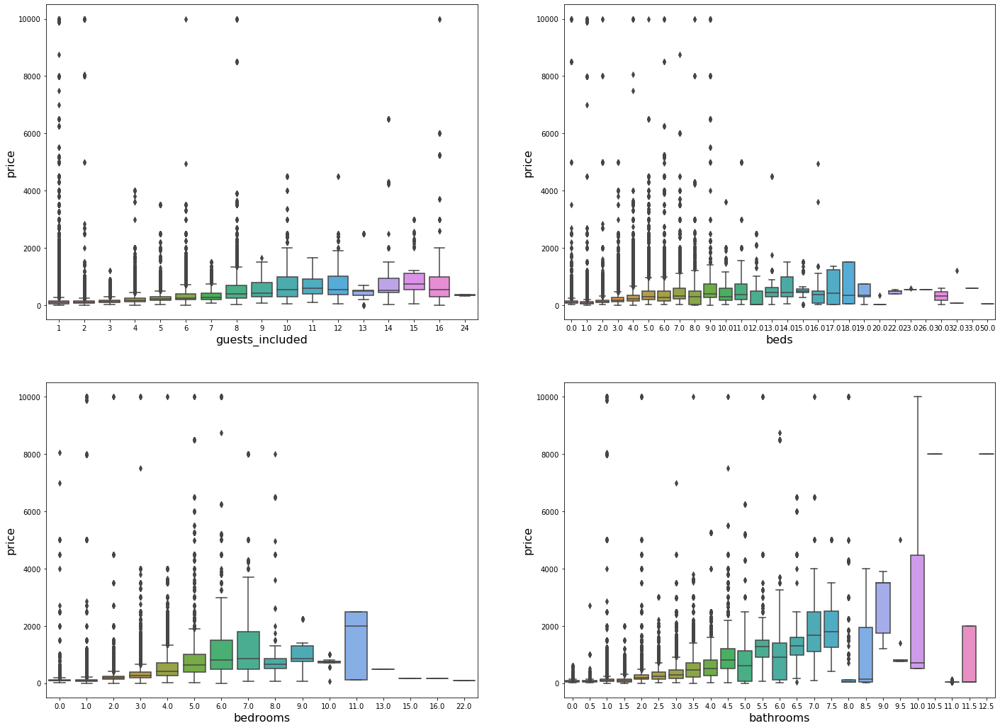

In [63]:
fig, ax = plt.subplots(2, 2, figsize=(24,18))
sns.boxplot(x='guests_included', y ='price', data=df_airbnb_LA, ax = ax[0,0])
sns.boxplot(x='beds', y ='price', data=df_airbnb_LA,  ax = ax[0,1])
sns.boxplot(x='bedrooms', y ='price', data=df_airbnb_LA,  ax = ax[1,0])
sns.boxplot(x='bathrooms', y ='price', data=df_airbnb_LA,  ax = ax[1,1])

ax[0,0].set_xlabel(ax[0,0].get_xlabel(), fontsize=16)
ax[0,1].set_xlabel(ax[0,1].get_xlabel(), fontsize=16)
ax[1,0].set_xlabel(ax[1,0].get_xlabel(), fontsize=16)
ax[1,1].set_xlabel(ax[1,1].get_xlabel(), fontsize=16)
ax[0,0].set_ylabel(ax[0,0].get_ylabel(), fontsize=16)
ax[0,1].set_ylabel(ax[0,1].get_ylabel(), fontsize=16)
ax[1,0].set_ylabel(ax[1,0].get_ylabel(), fontsize=16)
ax[1,1].set_ylabel(ax[1,1].get_ylabel(), fontsize=16)

plt.show()

Text(0.5, 0.98, 'Regression plot between dependent variable - price and other independent variables before removing outliers')

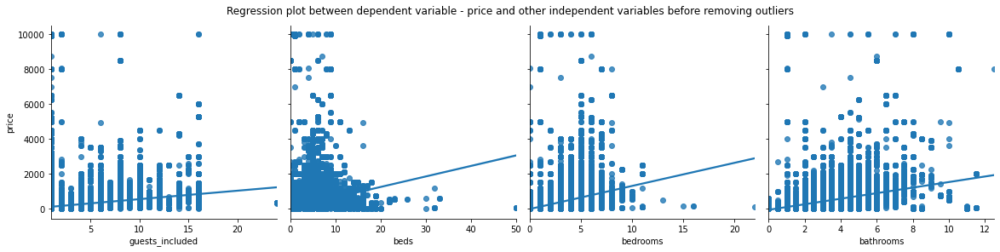

In [64]:
g = sns.PairGrid(df_airbnb_LA, y_vars=["price"], x_vars=["guests_included", "beds", "bedrooms", "bathrooms"], height=4)
g.map(sns.regplot, color="tab:blue")
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Regression plot between dependent variable - price and other independent variables before removing outliers')

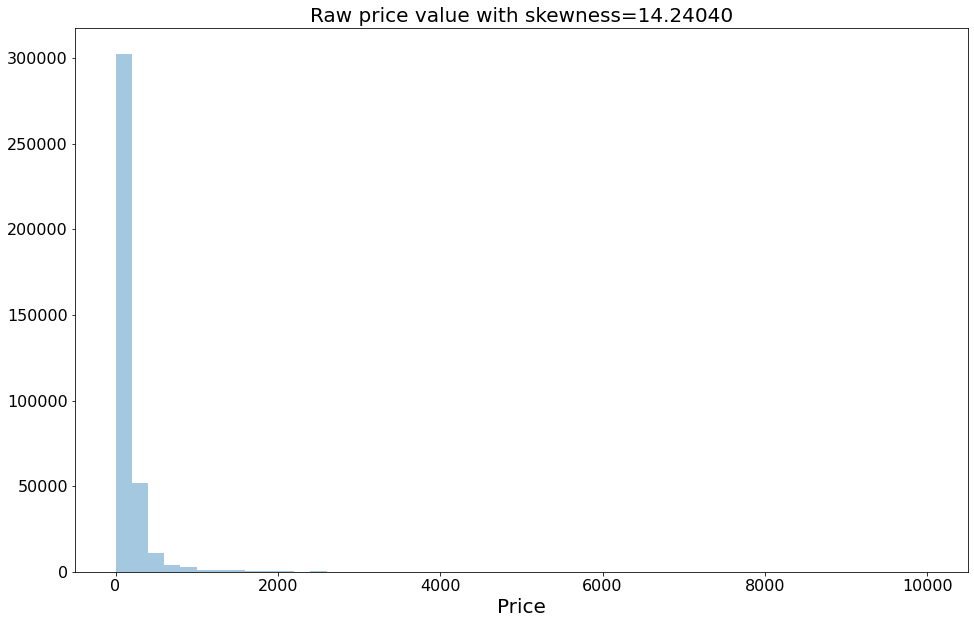

count    376899.000000
mean        167.840331
std         281.824264
min           0.000000
25%          70.000000
50%         108.000000
75%         175.000000
max       10000.000000
Name: price, dtype: float64

In [65]:
fig, ax = plt.subplots(1, 1, figsize=(16,10))
sns.distplot(df_airbnb_LA['price'], ax=ax, kde=False)
ax.set_title('Raw price value with skewness=%.5f'%(df_airbnb_LA['price'].skew()),fontsize=20)
ax.set_xlabel('Price',fontsize=20)
ax.tick_params(labelsize=16)
plt.show()
df_airbnb_LA['price'].describe()

In [66]:
Q1 = df_airbnb_LA['price'].quantile(0.25)
Q3 = df_airbnb_LA['price'].quantile(0.75)
IQR = Q3 - Q1
df_airbnb_LA = df_airbnb_LA[~((df_airbnb_LA['price'] < (Q1 - 1.5 * IQR)) | (df_airbnb_LA['price'] > (Q3 + 1.5 * IQR)))]

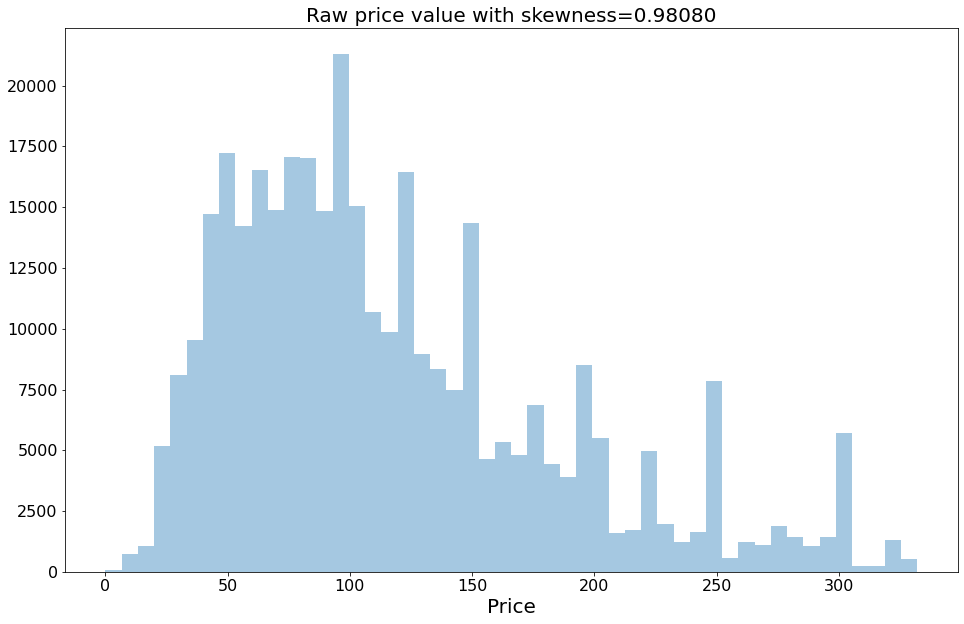

count    345405.000000
mean        116.745956
std          67.491648
min           0.000000
25%          65.000000
50%         100.000000
75%         150.000000
max         332.000000
Name: price, dtype: float64

In [67]:
fig, ax = plt.subplots(1, 1, figsize=(16,10))
sns.distplot(df_airbnb_LA['price'], ax=ax, kde=False)
ax.set_title('Raw price value with skewness=%.5f'%(df_airbnb_LA['price'].skew()),fontsize=20)
ax.set_xlabel('Price',fontsize=20)
ax.tick_params(labelsize=16)
plt.show()
df_airbnb_LA['price'].describe()

Text(0.5, 0.98, 'Regression plot between dependent variable - price and other independent variables after removing outliers')

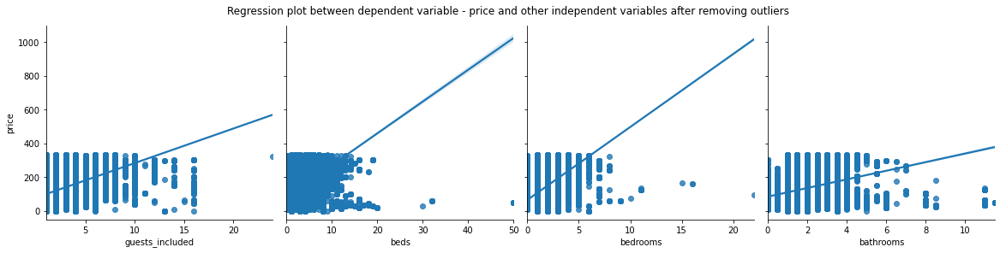

In [68]:
g = sns.PairGrid(df_airbnb_LA, y_vars=["price"], x_vars=["guests_included", "beds", "bedrooms", "bathrooms"], height=4)
g.map(sns.regplot, color="tab:blue")
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Regression plot between dependent variable - price and other independent variables after removing outliers')

In [69]:
print(raw_df_airbnb_LA.shape[0] - df_airbnb_LA.shape[0])

219443


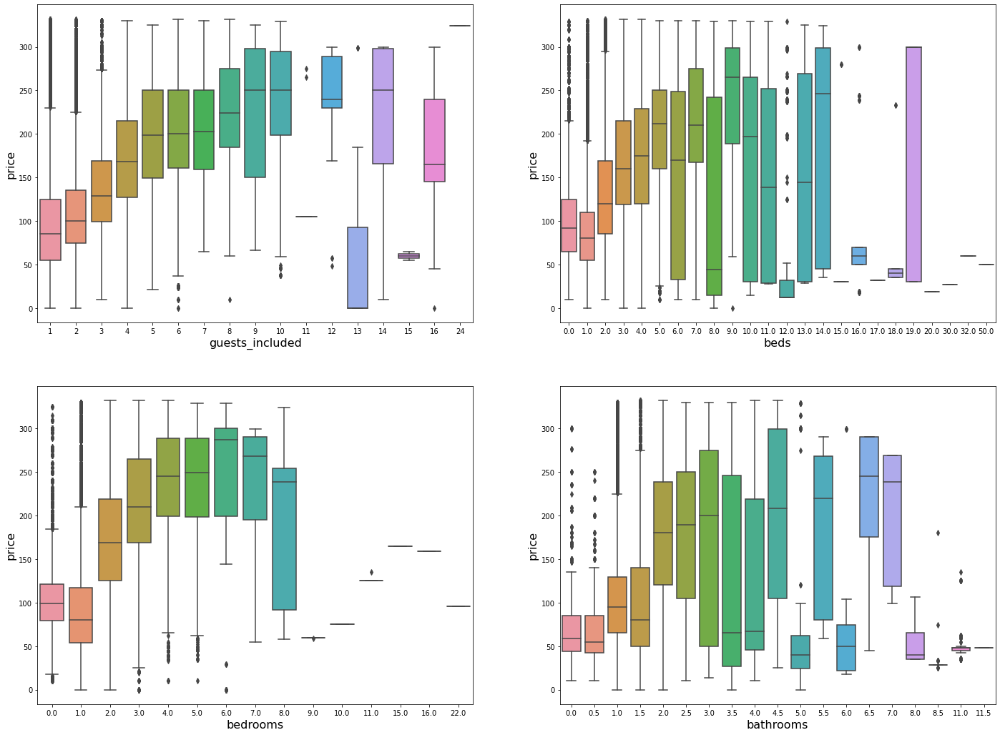

In [70]:
fig, ax = plt.subplots(2, 2, figsize=(24,18))
sns.boxplot(x='guests_included', y ='price', data=df_airbnb_LA, ax = ax[0,0])
sns.boxplot(x='beds', y ='price', data=df_airbnb_LA,  ax = ax[0,1])
sns.boxplot(x='bedrooms', y ='price', data=df_airbnb_LA,  ax = ax[1,0])
sns.boxplot(x='bathrooms', y ='price', data=df_airbnb_LA,  ax = ax[1,1])

ax[0,0].set_xlabel(ax[0,0].get_xlabel(), fontsize=16)
ax[0,1].set_xlabel(ax[0,1].get_xlabel(), fontsize=16)
ax[1,0].set_xlabel(ax[1,0].get_xlabel(), fontsize=16)
ax[1,1].set_xlabel(ax[1,1].get_xlabel(), fontsize=16)
ax[0,0].set_ylabel(ax[0,0].get_ylabel(), fontsize=16)
ax[0,1].set_ylabel(ax[0,1].get_ylabel(), fontsize=16)
ax[1,0].set_ylabel(ax[1,0].get_ylabel(), fontsize=16)
ax[1,1].set_ylabel(ax[1,1].get_ylabel(), fontsize=16)

plt.show()

In [71]:
df_airbnb_LA.drop(df_airbnb_LA.index[df_airbnb_LA['price'] == 0], inplace = True)

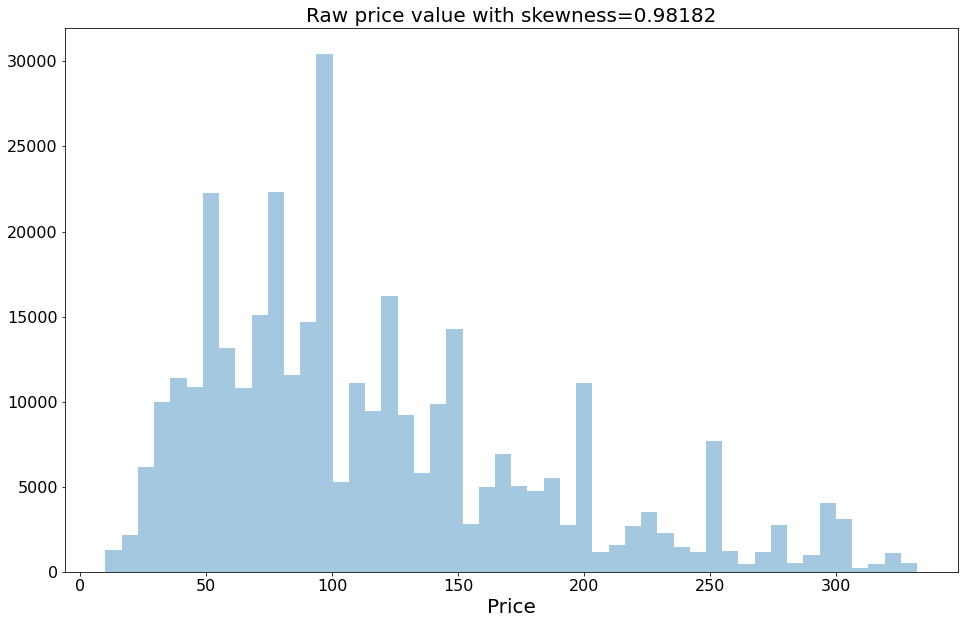

count    345315.000000
mean        116.776384
std          67.474118
min          10.000000
25%          65.000000
50%         100.000000
75%         150.000000
max         332.000000
Name: price, dtype: float64

In [72]:
fig, ax = plt.subplots(1, 1, figsize=(16,10))
sns.distplot(df_airbnb_LA['price'], ax=ax, kde=False)
ax.set_title('Raw price value with skewness=%.5f'%(df_airbnb_LA['price'].skew()),fontsize=20)
ax.set_xlabel('Price',fontsize=20)
ax.tick_params(labelsize=16)
plt.show()
df_airbnb_LA['price'].describe()

**Filtering only neibourhood located in Los Angeles city**

In [73]:
df_mask = df_airbnb_LA['city'] == 'Los Angeles'
df_airbnb_LA = df_airbnb_LA[df_mask]
df_airbnb_LA.shape

(210408, 35)

**Loading data set for extracting only neighbourhood in the boudaries of Los Angeles city**

In [74]:
la_neighbourhood_boundaries = pd.read_csv('../Data/LA_Times_Neighborhood_Boundaries.csv', error_bad_lines=False, low_memory=False)

In [75]:
la_neighbourhood_boundaries.OBJECTID.head()

0    1
1    2
2    3
3    4
4    5
Name: OBJECTID, dtype: int64

In [76]:
la_neighbourhood_boundaries['name'].nunique()

114

**Extracting rows that are in neighbourhood boundaries in Los Angeles**

In [77]:
df_airbnb_LA = pd.merge(df_airbnb_LA, la_neighbourhood_boundaries, left_on = 'neighbourhood_cleansed', right_on='name', how = 'inner')
df_airbnb_LA.drop(['OBJECTID', 'name'], axis = 1, inplace = True)

In [78]:
df_airbnb_LA['neighbourhood_cleansed'].nunique()

112

In [79]:
df_airbnb_LA.shape

(205824, 35)

In [80]:
def date2day(x):
    '''
    Usage: return day of the week based on the date provide
    Input arguments:
    x -- a date
    Return: a integer from 1-7 corresponding to Monday through Sunday
    '''
    if isinstance(x, datetime):
        return x.isoweekday()
    else:
        return x

In [81]:
df_airbnb_LA['booking_ratio'] = df_airbnb_LA['availability_365'].apply(lambda x: round((365 - x)/365*100),2)

In [82]:
df_airbnb_LA['last_scraped'] = pd.to_datetime(df_airbnb_LA['last_scraped'])

In [83]:
df_airbnb_LA['day_of_week'] = df_airbnb_LA['last_scraped'].apply(date2day)

### Data set summary after cleaning

In [84]:
mask = df_airbnb_LA.isna()
total = mask.sum()
percent = 100 * mask.mean()
missing_data = pd.concat([total, percent], axis=1, join='outer', keys=['Count missing values', 'Missing percentage'])
missing_data.sort_values(by='Missing percentage', ascending=False, inplace=True)
missing_data

,Count missing values,Missing percentage
id,0,0.0
amenities,0,0.0
security_deposit,0,0.0
cleaning_fee,0,0.0
guests_included,0,0.0
extra_people,0,0.0
minimum_nights,0,0.0
maximum_nights,0,0.0
availability_365,0,0.0
number_of_reviews,0,0.0


In [85]:
print('Original missing values', raw_df_airbnb_LA.isna().sum().sum())
print(f"Number of missing values are removed", f"{raw_df_airbnb_LA.isna().sum().sum()-df_airbnb_LA.isna().sum().sum()}")
print('Missing values after cleaning', df_airbnb_LA.isna().sum().sum())
print(f"Percentage of missing values after cleaned: "
      f"{(raw_df_airbnb_LA.isna().sum().sum() - df_airbnb_LA.isna().sum().sum())/raw_df_airbnb_LA.isna().sum().sum()*100}%")

Original missing values 7935677
Number of missing values are removed 7935677
Missing values after cleaning 0
Percentage of missing values after cleaned: 100.0%


In [86]:
# Data shape before and after cleaning process
print('Original data shape', raw_df_airbnb_LA.shape)
print('Shape after remove columns', df_airbnb_LA.shape)

#Number and percentage of rows has been removed after cleaning process
print(f"Number of rows has been removed: "
      f"{raw_df_airbnb_LA.shape[0] - df_airbnb_LA.shape[0]} rows")
print(f"Percentage of rows has been removed: "
      f"{round((raw_df_airbnb_LA.shape[0] - df_airbnb_LA.shape[0])/raw_df_airbnb_LA.shape[0]*100, 3)}%")

#Number and percentage of columns has been removed after cleaning process
print(f"Number of columns has been removed: "
      f"{raw_df_airbnb_LA.shape[1] - df_airbnb_LA.shape[1]} columns")
print(f"Percentage of columns has been removed: "
      f"{round((raw_df_airbnb_LA.shape[1] - df_airbnb_LA.shape[1])/raw_df_airbnb_LA.shape[1]*100, 2)}%")

Original data shape (564848, 106)
Shape after remove columns (205824, 37)
Number of rows has been removed: 359024 rows
Percentage of rows has been removed: 63.561%
Number of columns has been removed: 69 columns
Percentage of columns has been removed: 65.09%


- After remove unnecessary columns, there are 73 columns from original dataset are removed. And there are 4 columns which are derived from original columns. Hence the dataset after data preparation process have 37 columns which is approximately 65.09% columns has been removed. Those columns either contain many missing values or unrelated to the purpose of analysis.
- 359024 rows has been removed which occupies approximately 63.561% of dataset

<ipython-input-87-f11bfb4cda79>:3: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  df_airbnb_LA.hist(ax=ax)


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000218632536A0>,
      dtype=object)

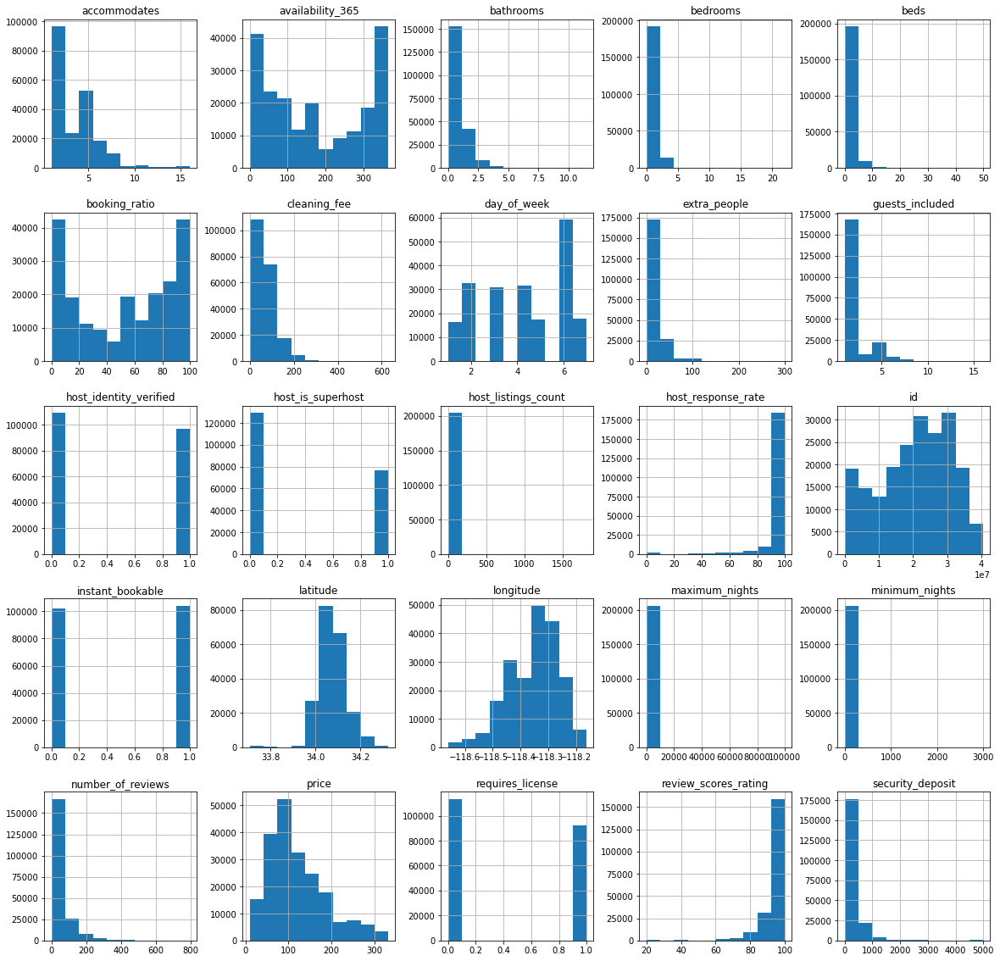

In [87]:
# plot distribution of dataset after data preparation process
fig, ax = plt.subplots(figsize=(20,20))
df_airbnb_LA.hist(ax=ax)

### Export csv file for the df_airbnb_LA dataset to merge with the supportive dataset for exploration later

In [88]:
# df_airbnb_LA.to_csv('df_airbnb_LA.csv')

# Explotary Data Analysis

In [89]:
merged_df_airbnb = pd.read_csv('../Data/merged_cleaned_airbnb.csv', error_bad_lines=False, low_memory=False, index_col=0)

## Booking ratio versus neighbourhood

In [90]:
def bar_plot(df, x = 'attribute', y = 'attribute', color_pal = 'Set3', nrows = 1, ncols = 1, 
             fig = None, sort_by_value = 'attribute', rotation_deg = 90, figsize = (10, 5), title = None):
    
    sns.set(style = "whitegrid", font_scale=1.3)
    plot_data = df.groupby(by = x)[y].mean().reset_index()
    plot_data = plot_data.sort_values(by = sort_by_value, ascending = True)

    if fig is None:
        fig = plt.figure(figsize = figsize)
        ax = fig.add_subplot()
    else:
        ax = fig.add_subplot(nrows, ncols, 1)
    ax = sns.barplot(x = x, y = y, data = plot_data, palette = color_pal, ax = ax)
    
    xlabels = ax.get_xticklabels()
    ax.set_xlabel(x)
    ax.set_xticklabels(xlabels, rotation=rotation_deg)
    
    ax.set_ylabel(y)
#     ax.set_ylim(int(plot_data['price'].min() - 20), int(plot_data['price'].max() + 5))
    ax.set_ylim(int(plot_data[y].min() - 20), int(plot_data[y].max()) + 2)
#     ax.set_title('Averaged ' + y + ' based on ' + x)
    ax.set_title(title)
    
    print('Los Angeles ' + y + ' Ranged From {} to {}, average: {}' \
              .format(int(plot_data[y].min()), int(plot_data[y].max()), int(plot_data[y].mean())))
    return ax

def box_plot_price(df, x, y, ax = None, order = False, figsize=(10,5)):
    """
    Return ordered box plots with differet categories x against price y 
    
    Arguments
    =========
        x: categorical variable
        figsize: tuple, size of the figure
    
    """    
    fig = ax.get_figure()
    if order:
        sort_y = df.groupby(x)[y].mean().sort_values(ascending=True).index
        ax = sns.boxplot(y=y, x=x, data=df, ax = ax, order=sort_y, showmeans=True, palette="Set3")
    else:
        ax = sns.boxplot(y=y, x=x, data=df, ax = ax, showmeans=True, palette="Set3")  
        ax.set_xticklabels(ax.get_xticklabels())

    return ax

Los Angeles booking_ratio Ranged From 10 to 72, average: 49


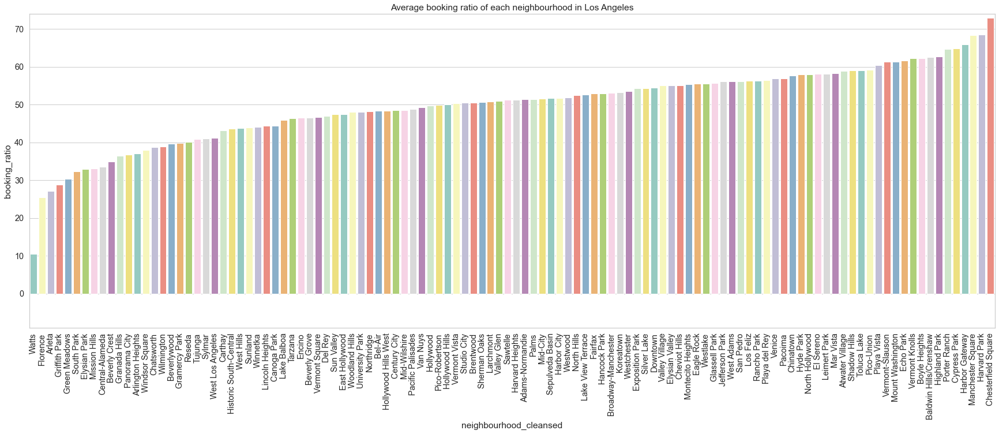

In [91]:
bar_plot(merged_df_airbnb, x='neighbourhood_cleansed',
         y='booking_ratio', sort_by_value='booking_ratio', figsize=(30, 10), 
         title = 'Average booking ratio of each neighbourhood in Los Angeles')

## Booking ratio versus price

Text(0.5, 1.0, 'Line graph between booking ratio versus value of price')

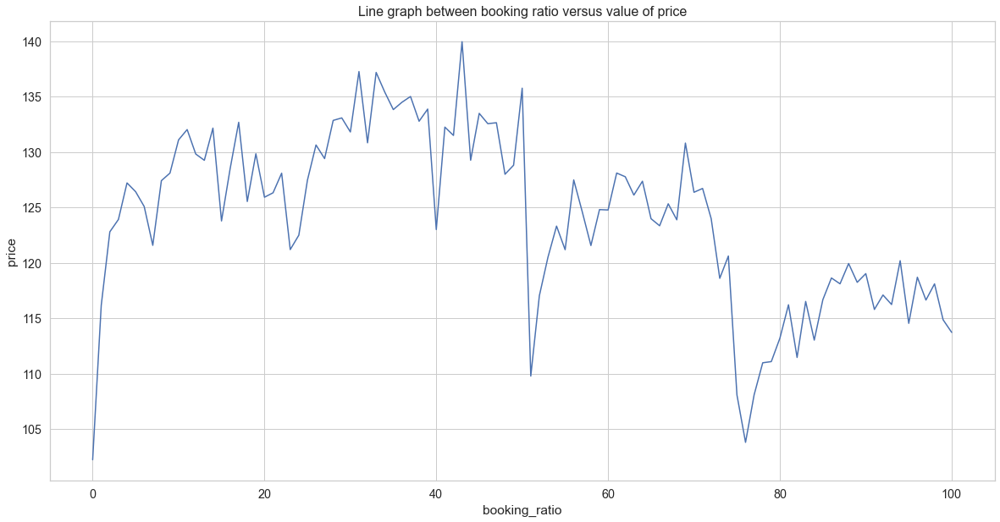

In [92]:
fig = plt.figure(figsize=(20,10))
ax = sns.lineplot(x='booking_ratio', y='price', data=merged_df_airbnb, err_style=None)
ax.set_title('Line graph between booking ratio versus value of price', fontsize = 16)

## Booking ratio versus property type

Los Angeles booking_ratio Ranged From 50 to 52, average: 51


,count,mean,std,min,25%,50%,75%,max
property_type,,,,,,,,
Apartment,94513.0,52.925587,35.966831,0.0,14.0,58.0,87.0,100.0
House,70767.0,52.577190,36.194745,0.0,13.0,58.0,85.0,100.0
Other,40544.0,50.394460,35.308981,0.0,13.0,56.0,82.0,100.0


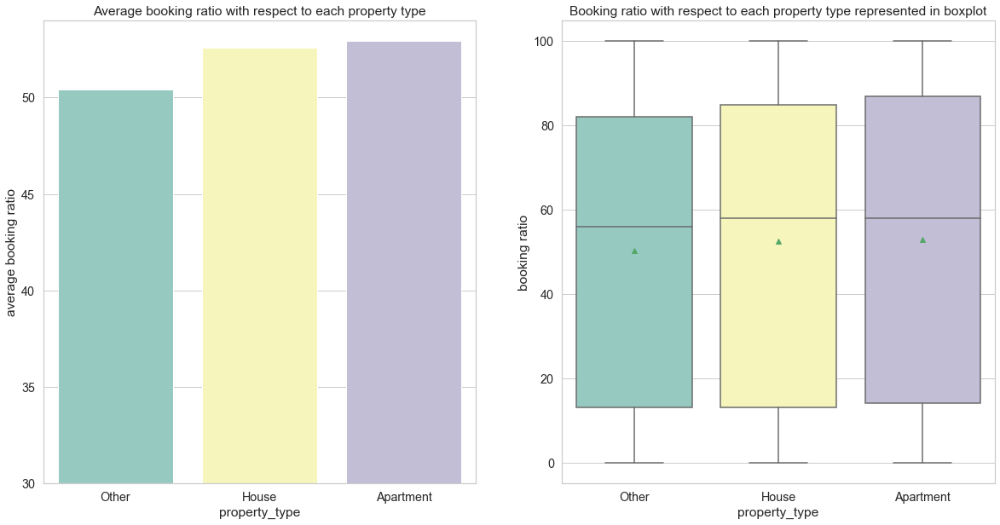

In [93]:
fig = plt.figure(figsize=(20,10))
ax = bar_plot(merged_df_airbnb, x = 'property_type', y = 'booking_ratio', sort_by_value= 'booking_ratio', 
               nrows = 1, ncols = 2, fig = fig, rotation_deg=0, figsize=(16,10))
ax.set_ylabel('average booking ratio')
ax.set_title('Average booking ratio with respect to each property type')

fig = ax.get_figure()
ax = fig.add_subplot(1,2,2)
box_plot_price(merged_df_airbnb,x = 'property_type', y = 'booking_ratio', order=True, ax=ax)
ax.set_ylabel('booking ratio')
ax.set_title('Booking ratio with respect to each property type represented in boxplot')
merged_df_airbnb.groupby('property_type')['booking_ratio'].describe()

## Bed type versus booking ratio, and price

Los Angeles booking_ratio Ranged From 47 to 57, average: 52


,count,mean,std,min,25%,50%,75%,max
bed_type,,,,,,,,
Airbed,416.0,55.519231,39.038808,0.0,9.00,69.5,94.25,100.0
Couch,128.0,57.937500,39.719638,0.0,11.75,65.5,98.25,100.0
Futon,852.0,51.563380,36.034576,0.0,13.00,54.0,84.00,100.0
Pull-out Sofa,668.0,47.473054,35.752827,0.0,12.00,51.0,79.25,100.0
Real Bed,203760.0,52.316073,35.919383,0.0,13.00,57.0,85.00,100.0


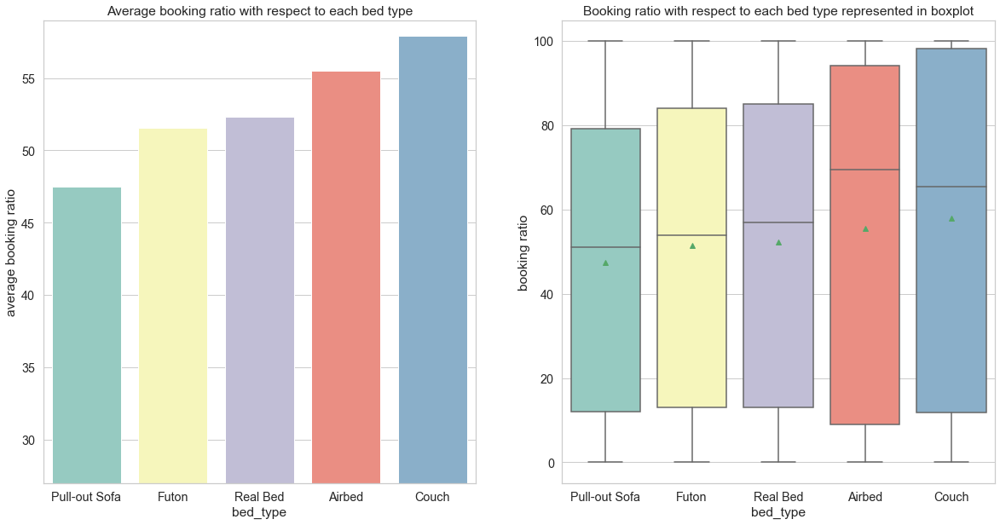

In [94]:
fig = plt.figure(figsize=(20,10))
ax = bar_plot(merged_df_airbnb, x = 'bed_type', y = 'booking_ratio', sort_by_value= 'booking_ratio', 
               nrows = 1, ncols = 2, fig = fig, rotation_deg=0, figsize=(16,10))
ax.set_ylabel('average booking ratio')
ax.set_title('Average booking ratio with respect to each bed type')

fig = ax.get_figure()
ax = fig.add_subplot(1,2,2)
box_plot_price(merged_df_airbnb, x = 'bed_type', y = 'booking_ratio', order = True, ax=ax)
ax.set_ylabel('booking ratio')
ax.set_title('Booking ratio with respect to each bed type represented in boxplot')

merged_df_airbnb.groupby('bed_type')['booking_ratio'].describe()

Los Angeles price Ranged From 52 to 120, average: 83


,count,mean,std,min,25%,50%,75%,max
bed_type,,,,,,,,
Airbed,416.0,76.437500,38.942354,27.0,50.0,60.0,92.00,215.0
Couch,128.0,52.359375,19.788939,20.0,35.0,55.0,68.00,100.0
Futon,852.0,75.464789,41.314192,25.0,50.0,65.5,88.25,263.0
Pull-out Sofa,668.0,92.931138,50.876056,25.0,65.0,83.0,100.00,275.0
Real Bed,203760.0,120.528386,67.152025,10.0,70.0,101.0,150.00,332.0


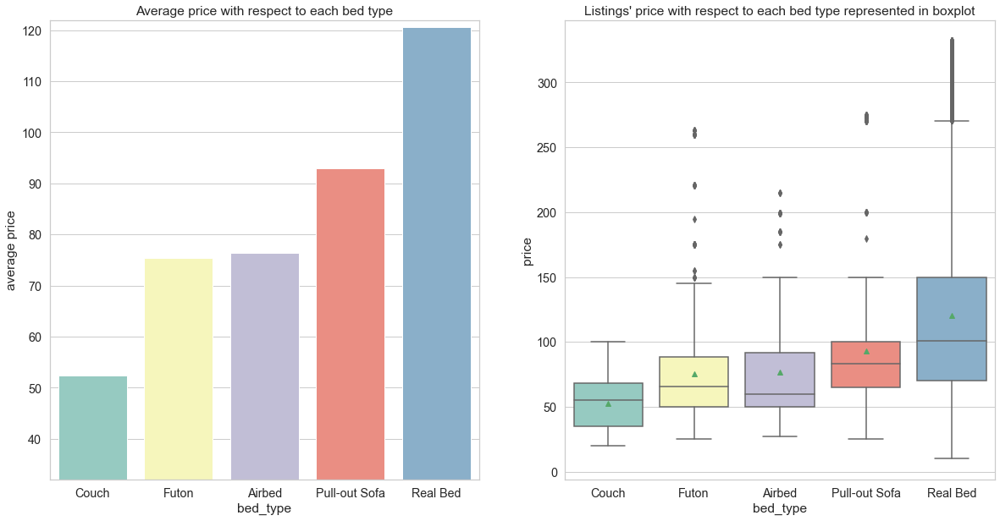

In [95]:
fig = plt.figure(figsize=(20,10))
ax = bar_plot(merged_df_airbnb, x = 'bed_type', y = 'price', sort_by_value= 'price', 
               nrows = 1, ncols = 2, fig = fig, rotation_deg=0, figsize=(16,10))
ax.set_ylabel('average price')
ax.set_title('Average price with respect to each bed type')

fig = ax.get_figure()
ax = fig.add_subplot(1,2,2)
box_plot_price(merged_df_airbnb, x = 'bed_type', y = 'price', order = True, ax=ax)
ax.set_ylabel('price')
ax.set_title("Listings' price with respect to each bed type represented in boxplot")

merged_df_airbnb.groupby('bed_type')['price'].describe()

## Room type versus booking ratio, and price

Los Angeles booking_ratio Ranged From 39 to 53, average: 46


,count,mean,std,min,25%,50%,75%,max
room_type,,,,,,,,
Entire home/apt,136762.0,53.134913,35.176837,0.0,16.0,58.0,86.0,100.0
Hotel room,1077.0,39.842154,36.610493,0.0,1.0,37.0,78.0,100.0
Private room,57610.0,52.333241,36.724864,0.0,11.0,58.0,85.0,100.0
Shared room,10375.0,42.545928,39.377499,0.0,1.0,42.0,79.0,100.0


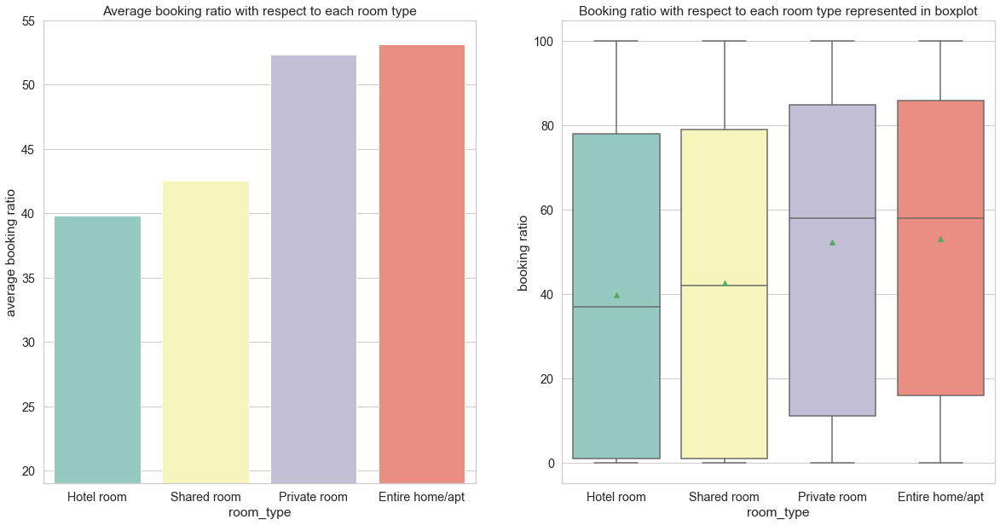

In [96]:
fig = plt.figure(figsize=(20,10))
ax = bar_plot(merged_df_airbnb, x = 'room_type', y = 'booking_ratio', sort_by_value= 'booking_ratio',
               nrows = 1, ncols = 2, fig = fig, rotation_deg=0, figsize=(16,10))
ax.set_ylabel('average booking ratio')
ax.set_title('Average booking ratio with respect to each room type')

fig = ax.get_figure()
ax = fig.add_subplot(1,2,2)
box_plot_price(merged_df_airbnb, x = 'room_type', y ='booking_ratio', order = True, ax=ax)
ax.set_ylabel('booking ratio')
ax.set_title("Booking ratio with respect to each room type represented in boxplot")

merged_df_airbnb.groupby('room_type')['booking_ratio'].describe()

Los Angeles price Ranged From 34 to 147, average: 80


,count,mean,std,min,25%,50%,75%,max
room_type,,,,,,,,
Entire home/apt,136762.0,147.326026,63.213877,10.0,99.0,130.0,185.0,332.0
Hotel room,1077.0,68.236769,56.143144,19.0,27.0,49.0,99.0,309.0
Private room,57610.0,72.015258,31.864220,10.0,50.0,65.0,85.0,330.0
Shared room,10375.0,34.009253,18.487265,10.0,24.0,30.0,40.0,271.0


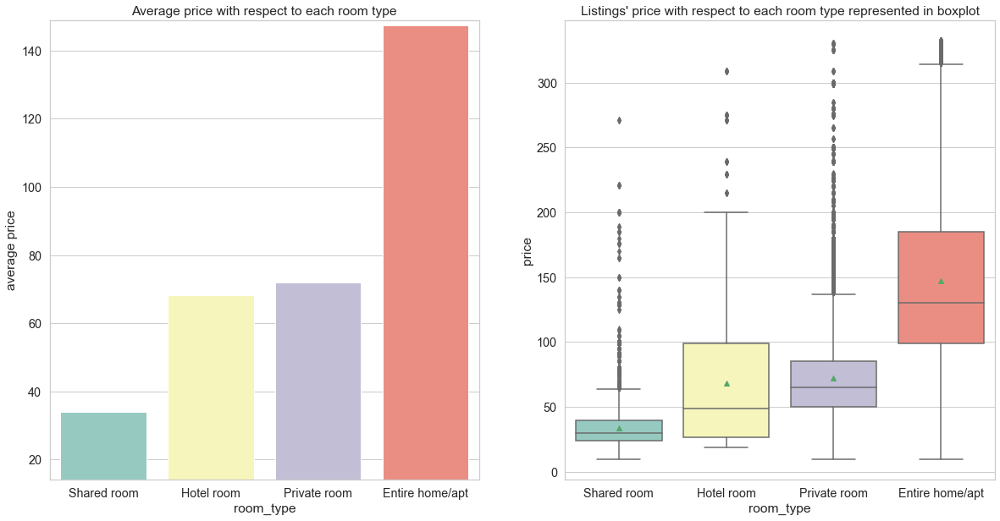

In [97]:
fig = plt.figure(figsize=(20,10))
ax = bar_plot(merged_df_airbnb, x = 'room_type', y = 'price', sort_by_value= 'price',
               nrows = 1, ncols = 2, fig = fig, rotation_deg=0, figsize=(16,10))
ax.set_ylabel('average price')
ax.set_title('Average price with respect to each room type')

fig = ax.get_figure()
ax = fig.add_subplot(1,2,2)
box_plot_price(merged_df_airbnb, x = 'room_type', y ='price', order = True, ax=ax)
ax.set_ylabel('price')
ax.set_title("Listings' price with respect to each room type represented in boxplot")

merged_df_airbnb.groupby('room_type')['price'].describe()

## Accommodates versus booking ratio, and price

Los Angeles booking_ratio Ranged From 30 to 55, average: 45


Text(0.5, 1.0, 'Booking ratio with respect to each accommodate represented in boxplot')

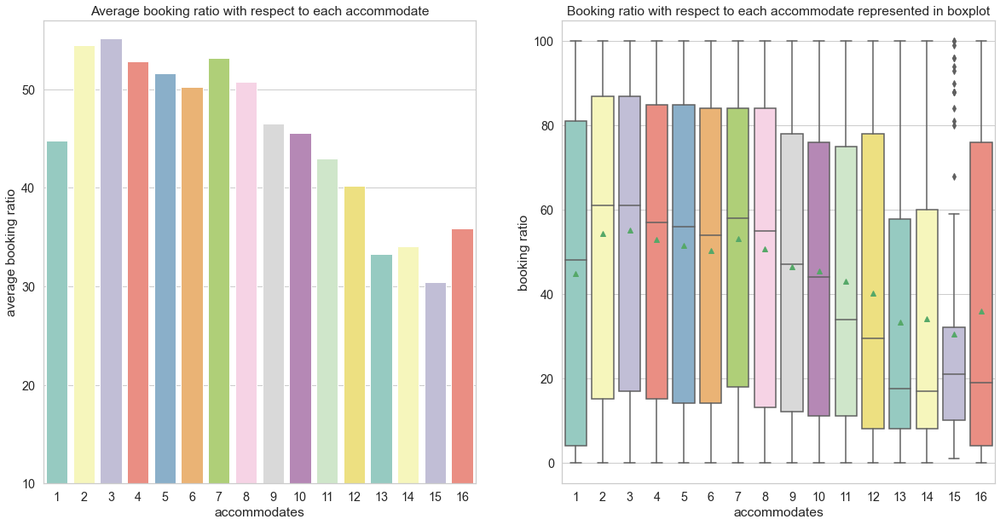

In [98]:
fig = plt.figure(figsize=(20,10))
ax = bar_plot(merged_df_airbnb, x = 'accommodates', y = 'booking_ratio', sort_by_value= 'booking_ratio', 
               nrows = 1, ncols = 2, fig = fig, rotation_deg=0, figsize=(16,10))
ax.set_ylabel('average booking ratio')
ax.set_title('Average booking ratio with respect to each accommodate')

fig = ax.get_figure()
ax = fig.add_subplot(1,2,2)
box_plot_price(merged_df_airbnb, x = 'accommodates', y ='booking_ratio', ax=ax)
ax.set_ylabel('booking ratio')
ax.set_title("Booking ratio with respect to each accommodate represented in boxplot")

Los Angeles price Ranged From 54 to 263, average: 184


Text(0.5, 1.0, "Listings' price with respect to each accommodate represented in boxplot")

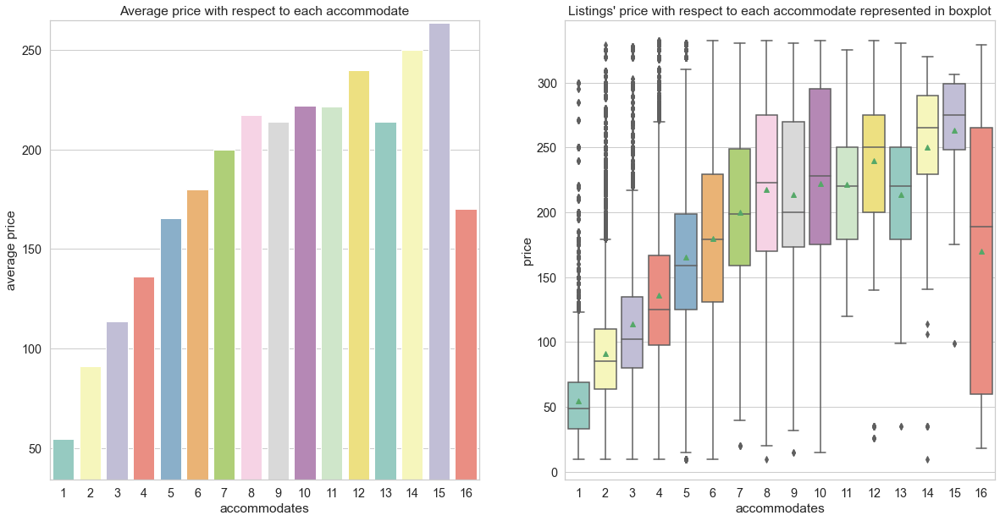

In [99]:
fig = plt.figure(figsize=(20,10))
ax = bar_plot(merged_df_airbnb, x = 'accommodates', y = 'price', sort_by_value= 'price', 
               nrows = 1, ncols = 2, fig = fig, rotation_deg=0, figsize=(16,10))
ax.set_ylabel('average price')
ax.set_title('Average price with respect to each accommodate')

fig = ax.get_figure()
ax = fig.add_subplot(1,2,2)
box_plot_price(merged_df_airbnb, x = 'accommodates', y ='price', ax=ax)
ax.set_ylabel('price')
ax.set_title("Listings' price with respect to each accommodate represented in boxplot")

## Host response rate versus booking ratio, and price

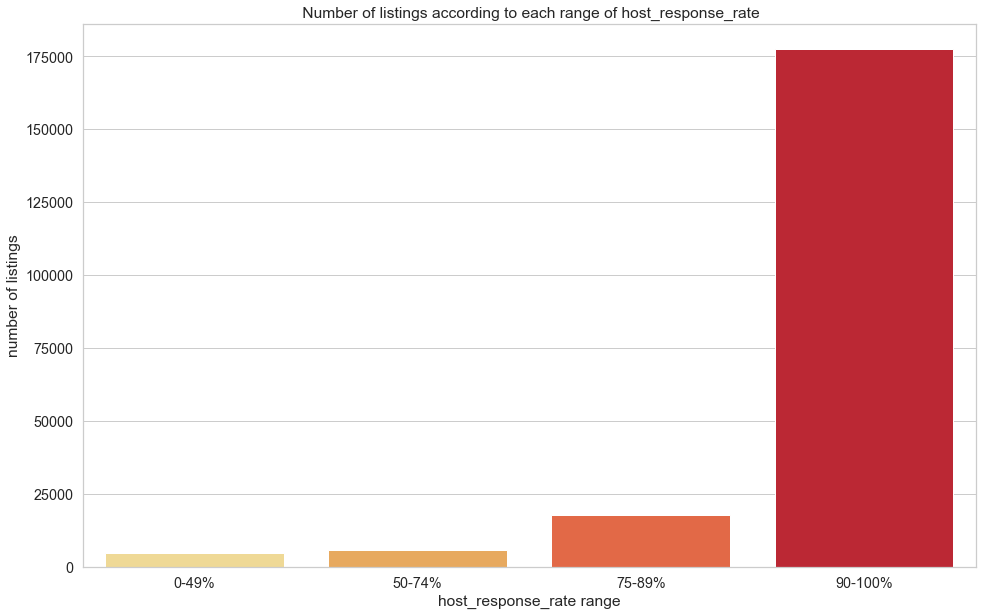

In [100]:
fig,ax = plt.subplots(1, 1, figsize = (16,10))
sns.countplot(x = 'host_response_rate_encoded', data = merged_df_airbnb, palette='YlOrRd', 
              order = merged_df_airbnb['host_response_rate_encoded'].value_counts(ascending=True).index)
ax.set_title(' Number of listings according to each range of host_response_rate')
ax.set_xlabel('host_response_rate range')
ax.set_ylabel('number of listings')
plt.show()

Los Angeles booking_ratio Ranged From 46 to 52, average: 49


Text(0, 0.5, 'average booking ratio')

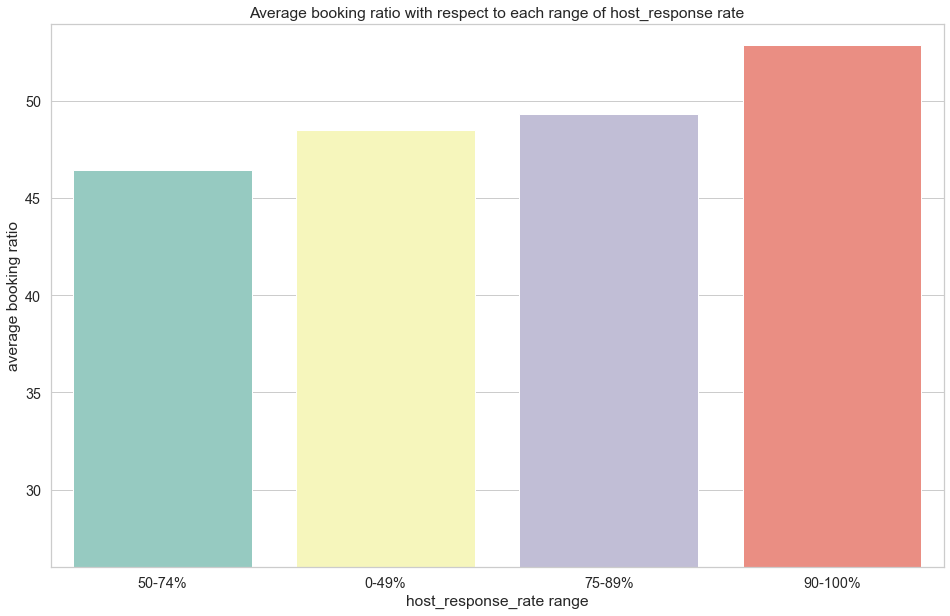

In [101]:
fig = plt.figure(figsize=(16, 10))
ax = bar_plot(merged_df_airbnb,
              x='host_response_rate_encoded',
              y='booking_ratio',
              sort_by_value='booking_ratio',
              nrows=1,
              ncols=1,
              fig=fig,
              rotation_deg=0,
              figsize=(16, 10), 
              title='Average booking ratio with respect to each range of host_response rate')
ax.set_xlabel('host_response_rate range')
ax.set_ylabel('average booking ratio')

## Cancellation policy versus price, booking ratio, and versus host's type

### Cancellation policy versus price of both types of host

Text(0.5, 1.0, 'Price vs Cancellation Policy')

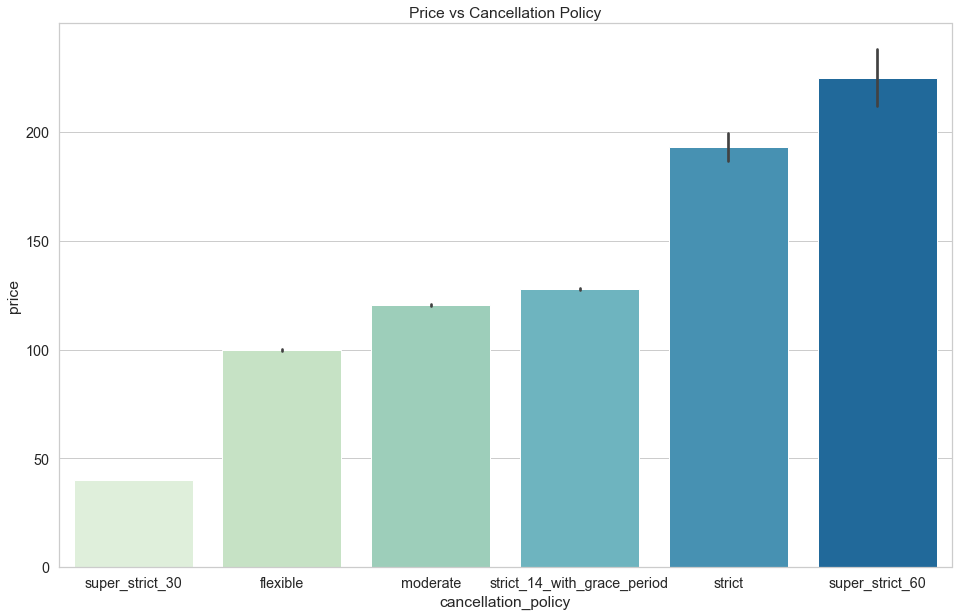

In [102]:
df = pd.DataFrame(merged_df_airbnb[['cancellation_policy', 'price']])
encoding_dict = dict(zip(['super_strict_30', 'flexible', 'moderate', 
                          'strict_14_with_grace_period', 'strict', 'super_strict_60'], [1, 2, 3, 4, 5, 6]))
df['code'] = df['cancellation_policy'].map(encoding_dict)
df.sort_values(by = 'code', ascending = True, inplace = True)

plt.figure(figsize=(16,10))
fig = sns.barplot(x = 'cancellation_policy', y='price', data = df, palette = "GnBu")
plt.title("Price vs Cancellation Policy")

### Cancellation policy versus booking ratio of both types of host

Los Angeles booking_ratio Ranged From 44 to 93, average: 58


Text(0, 0.5, 'average booking ratio')

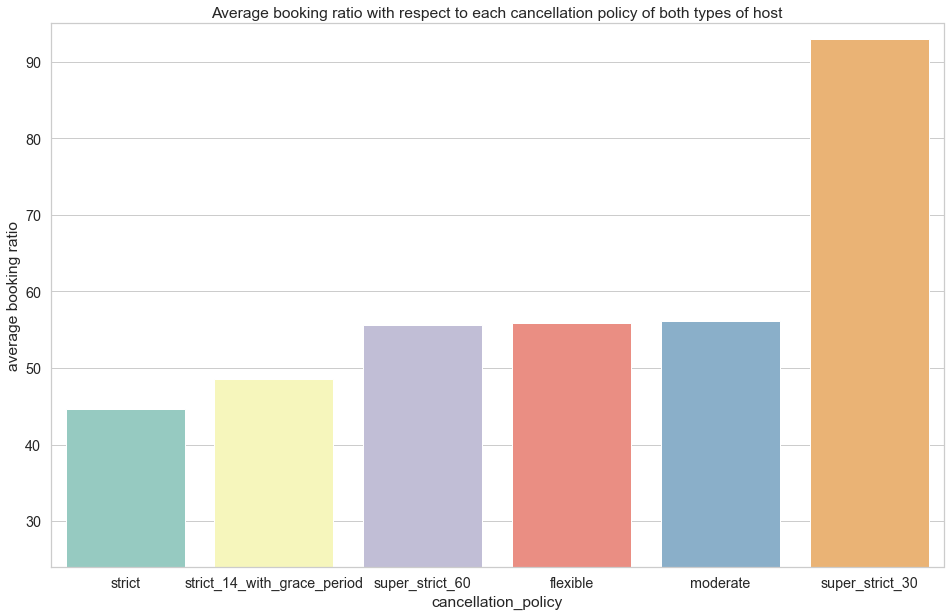

In [103]:
fig = plt.figure(figsize=(16, 10))
ax = bar_plot(merged_df_airbnb,
              x='cancellation_policy',
              y='booking_ratio',
              sort_by_value='booking_ratio',
              nrows=1,
              ncols=1,
              fig=fig,
              rotation_deg=0,
              figsize=(16, 10), 
              title='Average booking ratio with respect to each cancellation policy of both types of host')
merged_df_airbnb.groupby('cancellation_policy')['booking_ratio'].describe()
ax.set_ylabel('average booking ratio')

### Cancellation policy versus booking ratio of Superhost

In [104]:
cancellation_policy_of_superhost = merged_df_airbnb[merged_df_airbnb['host_is_superhost'] == 1]

Los Angeles booking_ratio Ranged From 19 to 93, average: 54


Text(0, 0.5, 'average booking ratio')

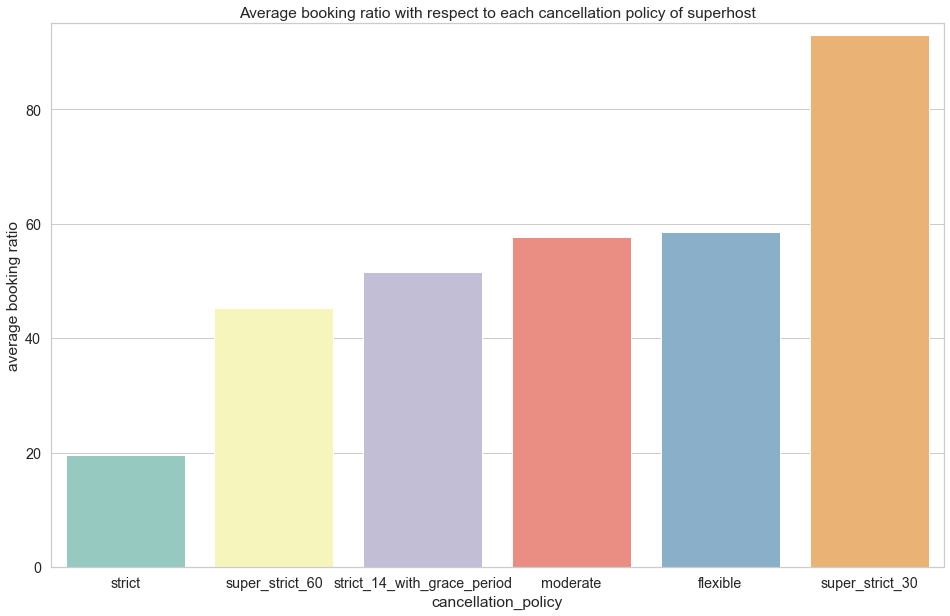

In [105]:
fig = plt.figure(figsize=(16, 10))
ax = bar_plot(cancellation_policy_of_superhost,
              x='cancellation_policy',
              y='booking_ratio',
              sort_by_value='booking_ratio',
              nrows=1,
              ncols=1,
              fig=fig,
              rotation_deg=0,
              figsize=(16, 10), 
              title='Average booking ratio with respect to each cancellation policy of superhost')
cancellation_policy_of_superhost.groupby(
    'cancellation_policy')['booking_ratio'].describe()
ax.set_ylabel('average booking ratio')

In [106]:
df_superhost_cancellation_policy = (merged_df_airbnb[merged_df_airbnb['host_is_superhost'] == 1].groupby(['host_is_superhost'])['cancellation_policy']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('cancellation_policy'))

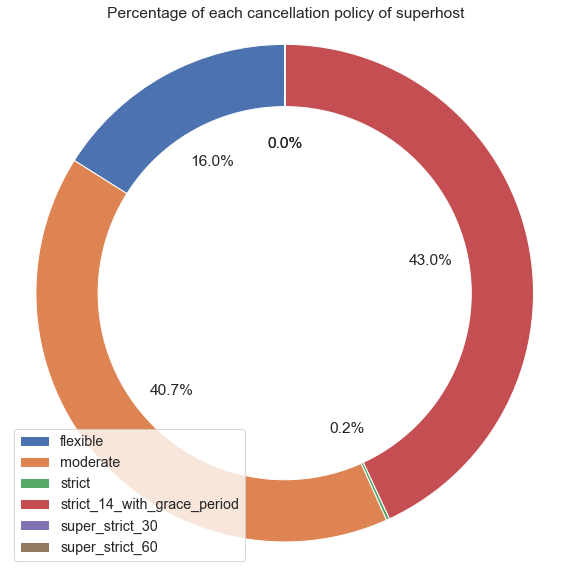

In [107]:
fig1, ax1 = plt.subplots(figsize=(16,10))
ax1 = plt.pie(df_superhost_cancellation_policy['percentage'], autopct='%1.1f%%', startangle=90)
fig1 = plt.gcf()
fig1.set_size_inches(10,10)
circle = plt.Circle(xy=(0,0), radius=0.75, facecolor='white')
plt.gca().add_artist(circle)
plt.legend(df_superhost_cancellation_policy['cancellation_policy'], loc='best')
plt.axis('equal')
plt.title('Percentage of each cancellation policy of superhost')
plt.show();

### Cancellation policy versus booking ratio of normal host

In [108]:
cancellation_policy_of_notsuperhost = merged_df_airbnb[merged_df_airbnb['host_is_superhost'] == 0]

Los Angeles booking_ratio Ranged From 47 to 71, average: 56


Text(0, 0.5, 'average booking ratio')

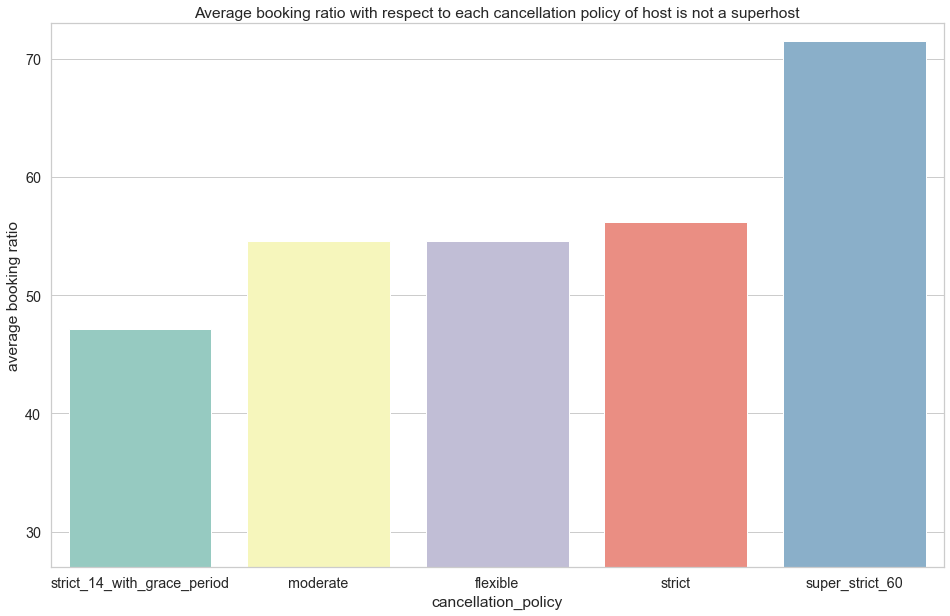

In [109]:
fig = plt.figure(figsize=(16, 10))
ax = bar_plot(cancellation_policy_of_notsuperhost,
              x='cancellation_policy',
              y='booking_ratio',
              sort_by_value='booking_ratio',
              nrows=1,
              ncols=1,
              fig=fig,
              rotation_deg=0,
              figsize=(16, 10), 
              title='Average booking ratio with respect to each cancellation policy of host is not a superhost')
cancellation_policy_of_notsuperhost.groupby(
    'cancellation_policy')['booking_ratio'].describe()
ax.set_ylabel('average booking ratio')

In [110]:
df_notsuperhost_cancellation_policy = (merged_df_airbnb[merged_df_airbnb['host_is_superhost'] == 0].groupby(['host_is_superhost'])['cancellation_policy']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('cancellation_policy'))

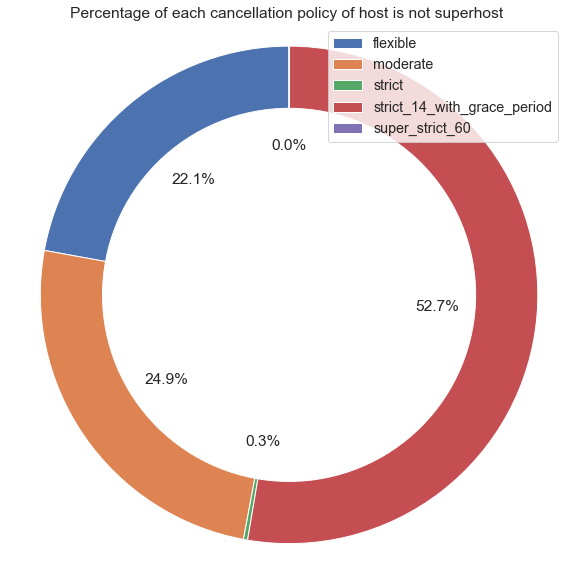

In [111]:
fig, ax = plt.subplots(figsize=(16,10))
ax = plt.pie(df_notsuperhost_cancellation_policy['percentage'], autopct='%1.1f%%', startangle=90)
fig = plt.gcf()
fig.set_size_inches(10,10)
circle = plt.Circle(xy=(0,0), radius=0.75, facecolor='white')
plt.gca().add_artist(circle)
plt.axis('equal')
plt.legend(df_notsuperhost_cancellation_policy['cancellation_policy'], loc='best')
plt.title('Percentage of each cancellation policy of host is not superhost')
plt.show();

## Host is superhost versus booking ratio

Los Angeles booking_ratio Ranged From 50 to 55, average: 52


,count,mean,std,min,25%,50%,75%,max
host_is_superhost,,,,,,,,
0.0,129428.0,50.663040,36.657907,0.0,11.0,55.0,84.0,100.0
1.0,76396.0,55.092714,34.482755,0.0,19.0,61.0,86.0,100.0


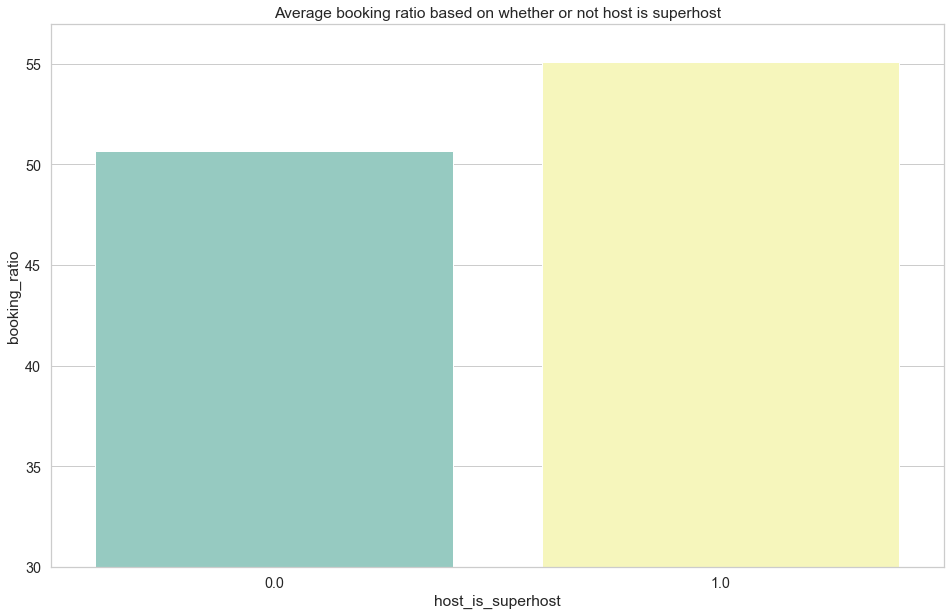

In [112]:
fig = plt.figure(figsize=(16, 10))
ax = bar_plot(merged_df_airbnb,
              x='host_is_superhost',
              y='booking_ratio',
              sort_by_value='booking_ratio',
              nrows=1,
              ncols=1,
              fig=fig,
              rotation_deg=0,
              figsize=(16, 10), 
              title='Average booking ratio based on whether or not host is superhost')
merged_df_airbnb.groupby('host_is_superhost')['booking_ratio'].describe()

## Number of reviews versus booking ratio

Text(0.5, 1.0, 'Line graph of number of reviews versus booking ratio')

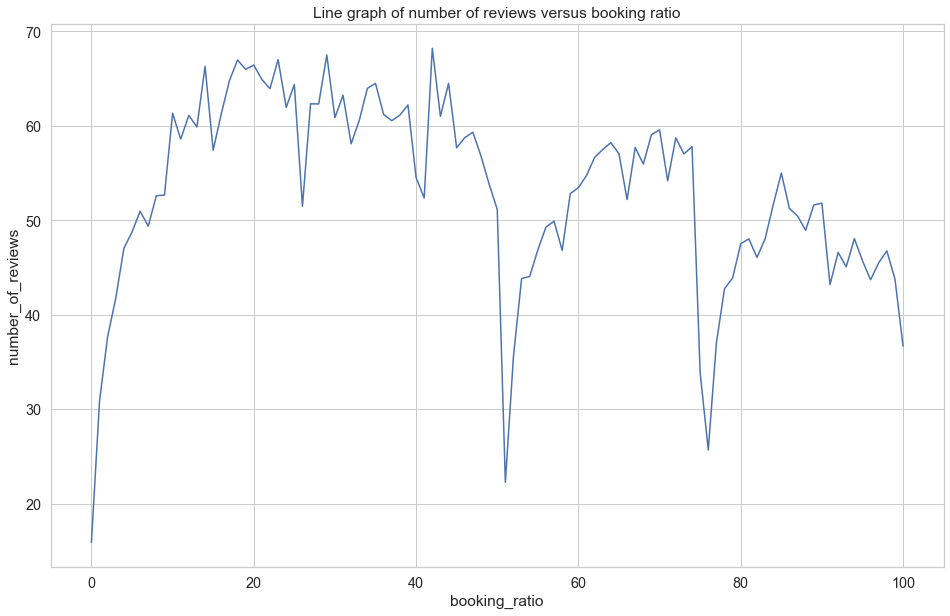

In [113]:
fig = plt.figure(figsize=(16,10))
ax = sns.lineplot(x='booking_ratio', y ='number_of_reviews', data=merged_df_airbnb, err_style=None)
plt.title('Line graph of number of reviews versus booking ratio')

## Host response time versus booking ratio

Los Angeles booking_ratio Ranged From 47 to 53, average: 50


,count,mean,std,min,25%,50%,75%,max
host_response_time,,,,,,,,
a few days or more,3303.0,47.479261,39.359155,0.0,2.0,51.0,83.0,100.0
within a day,16257.0,51.204958,37.341399,0.0,11.0,55.0,86.0,100.0
within a few hours,29643.0,49.373309,37.087203,0.0,10.0,53.0,84.0,100.0
within an hour,156621.0,53.078725,35.439336,0.0,15.0,58.0,85.0,100.0


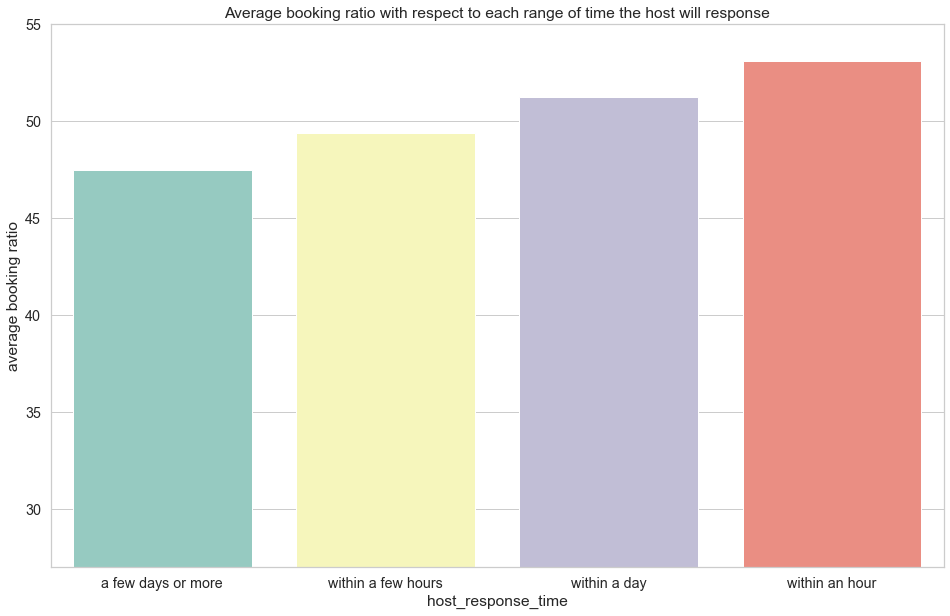

In [114]:
fig = plt.figure(figsize=(16, 10))
ax = bar_plot(merged_df_airbnb,
              x='host_response_time',
              y='booking_ratio',
              sort_by_value='booking_ratio',
              nrows=1,
              ncols=1,
              fig=fig,
              rotation_deg=0,
              figsize=(16, 10), 
              title='Average booking ratio with respect to each range of time the host will response')
ax.set_ylabel('average booking ratio')
merged_df_airbnb.groupby('host_response_time')['booking_ratio'].describe()

## Average price according to each neighbourhood in the Los Angeles City

In [115]:
locations = pd.DataFrame(merged_df_airbnb[['latitude', 'longitude']])
locations_list = locations.values.tolist()

In [116]:
la_geo = '../Data/la-county-neighborhoods.geojson'

In [117]:
## Initialize function to plot map
def los_angeles_map(df, geo_data, cols, key_on, legend, toggle_info = False):
    """
    Return an Interactive choropleth map of LA boroughs with some of the top LA attractions mark on the map
    Argument
    ========
    geo_data: geojson coordinate data
    df: pandas dataframe of LA borough data
    col: the columns of data to be bound.
    key_on: Variable in the geo_data GeoJSON file to bind the data to.
    legend: str, Title for data legend.
    Returns
    ========
    folium map object
    """
    la_map = folium.Map(location=[34.052235, -118.243683], zoom_start=10, tiles='Stamen Toner')

    folium.Choropleth(
        geo_data=geo_data,
        name='choropleth',
        data=df,
        columns=cols,
        key_on=key_on,
        fill_color='Set3',
        fill_opacity=0.6,
        line_opacity=0.3,
        legend_name=legend,
    ).add_to(la_map)

    folium.LayerControl().add_to(la_map)
    
    if toggle_info:
        for i in range(0, len(df)):
            popup_html = folium.Html('<h5>' + "Neighbourhood name: " +
                                     str(df['neighbourhood_cleansed'].iloc[i]) +
                                     '<h5>' + '<h5>' + "Average price: " +
                                     str(df['mean_price'].iloc[i]) + '<h5>',
                                     script=True)
            popup_info = folium.Popup(popup_html, max_width=2650)
            folium.Marker([df['latitude'].iloc[i], df['longitude'].iloc[i]],
                          popup=popup_info,
                          icon=folium.Icon(color='orange',
                                           icon='home')).add_to(la_map)

    return la_map

In [118]:
mean_price_neighborhood_df = pd.DataFrame(merged_df_airbnb[['neighbourhood_cleansed', 'latitude', 'longitude']])
mean_price_neighborhood_df = mean_price_neighborhood_df.groupby('neighbourhood_cleansed').agg(
        latitude=('latitude', lambda lat: lat.value_counts().index[0]),
        longitude=('longitude', lambda long: long.value_counts().index[0]))

mean_price_neighborhood_df['mean_price'] = merged_df_airbnb.groupby('neighbourhood_cleansed').price.mean()
mean_price_neighborhood_df['mean_price'] = mean_price_neighborhood_df['mean_price'].astype('int64')
mean_price_neighborhood_df.reset_index(inplace=True)
mean_price_neighborhood_df.sort_values(by='mean_price',
                                       ascending=False,
                                       inplace=True)
mean_price_neighborhood_df.head(5)

,neighbourhood_cleansed,latitude,longitude,mean_price
6,Beverly Crest,34.10889,-118.44686,171
5,Bel-Air,34.08840,-118.46123,167
73,Playa Vista,33.97714,-118.42602,166
96,Venice,33.99501,-118.46808,161
47,Hollywood Hills West,34.10717,-118.36317,154


In [119]:
import plotly.express as px
import plotly
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot, enable_mpl_offline
init_notebook_mode()
enable_mpl_offline()
LA_lat = 34.052235
LA_long = -118.243683

def los_angeles_map_plotly(df, geo_data, map_style = 'outdoors', col_locations = 'attribute',
                           col_color = 'attribute', color_scale = 'Agsunset', title=None):
    px.set_mapbox_access_token('pk.eyJ1Ijoia2hvYWxlIiwiYSI6ImNrZjc1N2Q3eDA2ZzMyeW5yYjYxbjVkN2YifQ.wmPUhUtQ9y5-W9anGJXkLA')
    fig = px.choropleth_mapbox(df,
                           geojson=geo_data,
                           mapbox_style = map_style,
                           locations=col_locations,
                           color=col_color,
                           featureidkey='properties.name',
                           color_continuous_scale = color_scale,
                           center={"lat": LA_lat,"lon": LA_long},
                           opacity=0.5, zoom = 9, height=700, 
                           title=title)
    fig.update_layout(margin={"r":0,"t":25,"l":0,"b":0})

    return fig

In [120]:
mean_price_la_map = los_angeles_map_plotly(
    mean_price_neighborhood_df,
    geo_data=la_geo,
    col_locations='neighbourhood_cleansed',
    col_color='mean_price',
    color_scale='thermal',
    title='Graphical map represents the average price at each neighbourhood in Los Angeles'
)
iplot(mean_price_la_map, validate=False, filename='Average price at each neighbourhood in Los Angeles')

## Average booking ratio according to each neighbourhood in the Los Angeles City

In [121]:
mean_booking_ratio_neighborhood_df = pd.DataFrame(merged_df_airbnb[['neighbourhood_cleansed', 'latitude', 'longitude']])
mean_booking_ratio_neighborhood_df = mean_booking_ratio_neighborhood_df.groupby('neighbourhood_cleansed').agg(
        latitude=('latitude', lambda lat: lat.value_counts().index[0]),
        longitude=('longitude', lambda long: long.value_counts().index[0]))

mean_booking_ratio_neighborhood_df['average_booking_ratio'] = merged_df_airbnb.groupby('neighbourhood_cleansed')['booking_ratio'].mean()
mean_booking_ratio_neighborhood_df['average_booking_ratio'] = mean_booking_ratio_neighborhood_df['average_booking_ratio'].astype('int64')
mean_booking_ratio_neighborhood_df.reset_index(inplace=True)
mean_booking_ratio_neighborhood_df.sort_values(by='average_booking_ratio',
                                       ascending=False,
                                       inplace=True)
mean_booking_ratio_neighborhood_df.head(5)

,neighbourhood_cleansed,latitude,longitude,average_booking_ratio
17,Chesterfield Square,33.98788,-118.31193,72
57,Manchester Square,33.96814,-118.30191,68
42,Harvard Park,33.98183,-118.30132,68
40,Harbor Gateway,33.91797,-118.28733,65
75,Porter Ranch,34.27261,-118.53222,64


In [122]:
mean_booking_ratio_la_map = los_angeles_map_plotly(
    mean_booking_ratio_neighborhood_df,
    geo_data=la_geo,
    col_locations='neighbourhood_cleansed',
    col_color='average_booking_ratio',
    color_scale='thermal',
    title='Graphical map represents the average booking ratio at each neighbourhood in Los Angeles'
)
iplot(mean_booking_ratio_la_map, validate=False, filename='Average booking ratio at each neighbourhood in Los Angeles')

## Explore number of listings per neighbourhood in Los Angeles

In [123]:
merged_df_airbnb.reset_index('id',inplace=True)

In [124]:
count_listings_df = pd.DataFrame(merged_df_airbnb[['neighbourhood_cleansed', 'latitude', 'longitude']])

In [125]:
list_listings_neighbourhood = count_listings_df.groupby('neighbourhood_cleansed').agg(
        latitude=('latitude', lambda lat: lat.value_counts().index[0]),
        longitude=('longitude', lambda long: long.value_counts().index[0]))
list_listings_neighbourhood.reset_index(inplace=True)

In [126]:
count_listings_df = count_listings_df.groupby(
    'neighbourhood_cleansed').neighbourhood_cleansed.count().rename_axis(
        'neighbourhood').reset_index(name='num_listings')

In [127]:
list_listings_neighbourhood = list_listings_neighbourhood.join(count_listings_df['num_listings'])

In [128]:
list_listings_neighbourhood.head()

,neighbourhood_cleansed,latitude,longitude,num_listings
0,Adams-Normandie,34.03430,-118.29863,558
1,Arleta,34.23743,-118.42133,67
2,Arlington Heights,34.04913,-118.31755,1683
3,Atwater Village,34.10976,-118.25932,1274
4,Baldwin Hills/Crenshaw,34.00568,-118.36916,780


In [130]:
LA_lat = 34.052235
LA_long = -118.243683
px.set_mapbox_access_token('pk.eyJ1Ijoia2hvYWxlIiwiYSI6ImNrZjc1N2Q3eDA2ZzMyeW5yYjYxbjVkN2YifQ.wmPUhUtQ9y5-W9anGJXkLA')

fig = px.scatter_mapbox(
    list_listings_neighbourhood,
    lat='latitude',
    lon='longitude',
    size='num_listings',
    color='num_listings',
    hover_name='neighbourhood_cleansed',
    color_continuous_scale='plasma',
    center={
        "lat": LA_lat,
        "lon": LA_long
    },
    mapbox_style='outdoors',
    height=700,
    zoom=9,
    title='Graphical map represents the number of listings at each neighbourhood in Los Angeles')

fig.update_layout(margin={"r":0,"t":25,"l":0,"b":0})
iplot(fig, validate=False, filename='Number of listings at each neighbourhood in Los Angeles')

## Amenities versus Price

**amenities** attribute consists of a long list of amenities in string format. To completely utilize this attribute, we will split the list into a set of amentities. Then, they will be endcoded into categorical dummy variables. We can also calculate the total count of amenties, **total_amenities** as a new attribute.

In [131]:
merged_df_airbnb['amenities'] = merged_df_airbnb['amenities'].str.replace("[{}]", "").str.replace('"', "")

In [132]:
amenities_process_df = merged_df_airbnb.copy()

In [133]:
amenities_series = pd.Series(
    np.concatenate(
        np.array(amenities_process_df['amenities'].map(
            lambda amns: amns.split(","))))).value_counts()

In [134]:
amenities_percentage_occur = pd.DataFrame(columns=['amenities', 'total', 'appearing percentage'])
amenities = []
total = []
percent = []
for index, item in amenities_series.iteritems():
    amenities.append(index)
    total.append(item)
    percent.append(item/len(amenities_process_df)*100)
    
amenities_percentage_occur['amenities'] = amenities
amenities_percentage_occur['total'] = total
amenities_percentage_occur['appearing percentage'] = percent

In [135]:
df_important_amenities = amenities_percentage_occur[amenities_percentage_occur['appearing percentage'] >= 20]
df_important_amenities

,amenities,total,appearing percentage
0,Wifi,203634,98.935984
1,Essentials,200757,97.538188
2,Smoke detector,195164,94.820818
3,Heating,188099,91.388273
4,Hangers,183578,89.191737
5,Kitchen,183225,89.020231
6,Shampoo,176128,85.572139
7,Hair dryer,169869,82.531192
8,Carbon monoxide detector,169106,82.160487
9,TV,168416,81.825249


D:\Softwares\Anaconda\lib\site-packages\plotly\matplotlylib\mpltools.py:368: MatplotlibDeprecationWarning:


The is_frame_like function was deprecated in Matplotlib 3.1 and will be removed in 3.3.

D:\Softwares\Anaconda\lib\site-packages\plotly\matplotlylib\renderer.py:547: UserWarning:

Looks like the annotation(s) you are trying 
to draw lies/lay outside the given figure size.

Therefore, the resulting Plotly figure may not be 
large enough to view the full text. To adjust 
the size of the figure, use the 'width' and 
'height' keys in the Layout object. Alternatively,
use the Margin object to adjust the figure's margins.



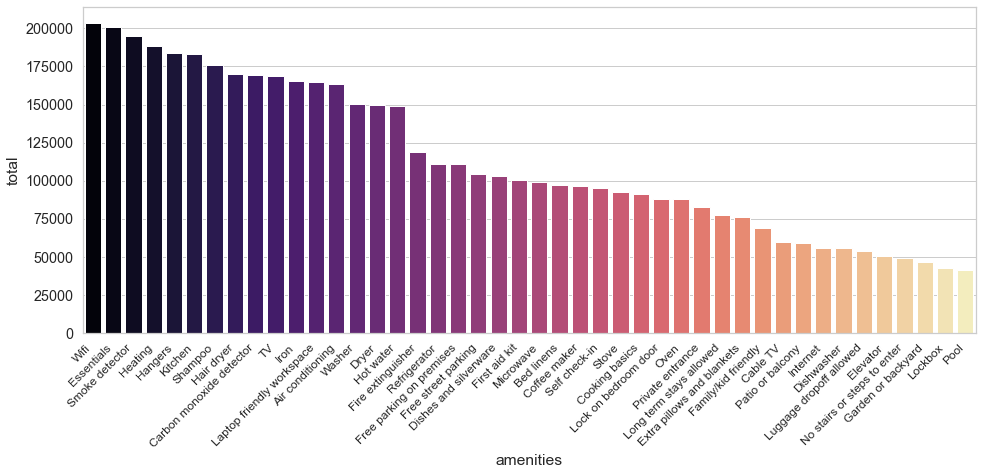

In [136]:
fig, ax = plt.subplots(figsize=(16, 6))
sns.barplot(df_important_amenities['amenities'], df_important_amenities['total'], palette=("magma"))
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=12);

In [137]:
def process_amenity(df):
    '''
    Usage: process amenity column in the dataframe
    Input: 
    df - the dataframe containing amenities column
    Return: a dictionary containing all unique amenity, 
            with each key linked to a list of dataframe index of row
            containing that amenity
    '''
    if 'amenities' not in df.columns:
        return
    
    listings = df['amenities'].tolist()
    listing_amenity = dict()
    for i, listing in enumerate(listings):
        amenities = listing.split(',')
        for amenity in amenities:
            amenity = re.sub(r'[^a-zA-Z]', "", amenity)
            listing_amenity.setdefault(amenity, list())
            listing_amenity[amenity].append(i)
    return listing_amenity

def add_new_amenity(df, listing_amenity, new_feature):
    '''
    Usage: add categorical variable of one particular amenity to the dataframe
    Input: 
    df - the dataframe to which you want to add the amenity category variable
    listing_amenity - a dictionary of amenities which contains lists of indexes
    new_feature - the name of amenity category variable 
    Return: None
    '''
    arr = np.zeros(df.shape[0], dtype=int)
    items = listing_amenity[new_feature]
    for item in items:
        arr[item] = 1
    df[new_feature] = arr

In [138]:
import re
# iterate over each amenity and add its categorical dummy variable to the dataframe
amenities_list = process_amenity(df_important_amenities)
amenities_categorical = set(amenities_list.keys())
amenities_cols = []
for item in amenities_categorical:
    amenities_cols.append(item)
    add_new_amenity(amenities_process_df, amenities_list, item)

In [139]:
print(amenities_cols)

['CableTV', 'Carbonmonoxidedetector', 'Privateentrance', 'Dishwasher', 'Washer', 'Kitchen', 'Lockbox', 'Dishesandsilverware', 'Dryer', 'Wifi', 'Smokedetector', 'Luggagedropoffallowed', 'Nostairsorstepstoenter', 'Hangers', 'Airconditioning', 'Cookingbasics', 'Longtermstaysallowed', 'Extrapillowsandblankets', 'Refrigerator', 'Freestreetparking', 'Iron', 'Shampoo', 'Pool', 'Essentials', 'Oven', 'Stove', 'Fireextinguisher', 'Microwave', 'Familykidfriendly', 'Laptopfriendlyworkspace', 'Internet', 'Freeparkingonpremises', 'Firstaidkit', 'Lockonbedroomdoor', 'Coffeemaker', 'Selfcheckin', 'Elevator', 'Gardenorbackyard', 'TV', 'Heating', 'Hairdryer', 'Hotwater', 'Bedlinens', 'Patioorbalcony']


In [140]:
# calculate the price difference between the listing with specific amenity and listing without amenity
amenities_price = pd.DataFrame(data= np.zeros((len(amenities_cols), 2)), 
                        index = amenities_cols, columns = ['price_without_amenity', 'price_with_amenity'])
for col in amenities_cols:
    price_without_amenity = amenities_process_df[amenities_process_df[col] == 0]['price'].mean()
    price_with_amenity = amenities_process_df[amenities_process_df[col] == 1]['price'].mean()
    amenities_price.loc[col,'price_without_amenity'] = price_without_amenity
    amenities_price.loc[col,'price_with_amenity'] = price_with_amenity
    amenities_price.loc[col,'price_difference'] = price_with_amenity - price_without_amenity
    amenities_price.loc[col,'%price_difference'] = (price_with_amenity - price_without_amenity)/price_without_amenity
    amenities_price.loc[col,'%price_abs_difference'] = np.abs((price_with_amenity - price_without_amenity)/price_without_amenity)
amenities_price = amenities_price.sort_values(by='%price_abs_difference', ascending = False)

# calculate the total number of amenities, store it into a new column
amenities_process_df['total_amenities'] = amenities_process_df['amenities'].apply(lambda x: x.count(',')-1 )
amenities_process_df = amenities_process_df.drop(labels = 'amenities', axis = 1)

In [141]:
amenities_price['amenities'] = amenities_price.index
amenities_price.reset_index(drop = True, inplace=True)

In [142]:
amenities_price

,price_without_amenity,price_with_amenity,price_difference,%price_difference,%price_abs_difference,amenities
0,120.120147,249.0,128.879853,1.072925,1.072925,Iron
1,120.121157,41.0,-79.121157,-0.658678,0.658678,Luggagedropoffallowed
2,120.121089,55.0,-65.121089,-0.542129,0.542129,Laptopfriendlyworkspace
3,120.121089,55.0,-65.121089,-0.542129,0.542129,Stove
4,120.121065,60.0,-60.121065,-0.500504,0.500504,CableTV
5,120.121065,60.0,-60.121065,-0.500504,0.500504,Familykidfriendly
6,120.121065,60.0,-60.121065,-0.500504,0.500504,Extrapillowsandblankets
7,120.121051,63.0,-57.121051,-0.475529,0.475529,Longtermstaysallowed
8,120.121041,65.0,-55.121041,-0.458879,0.458879,Freeparkingonpremises
9,120.121041,65.0,-55.121041,-0.458879,0.458879,Internet


D:\Softwares\Anaconda\lib\site-packages\plotly\matplotlylib\mpltools.py:368: MatplotlibDeprecationWarning:


The is_frame_like function was deprecated in Matplotlib 3.1 and will be removed in 3.3.

D:\Softwares\Anaconda\lib\site-packages\plotly\matplotlylib\renderer.py:547: UserWarning:

Looks like the annotation(s) you are trying 
to draw lies/lay outside the given figure size.

Therefore, the resulting Plotly figure may not be 
large enough to view the full text. To adjust 
the size of the figure, use the 'width' and 
'height' keys in the Layout object. Alternatively,
use the Margin object to adjust the figure's margins.



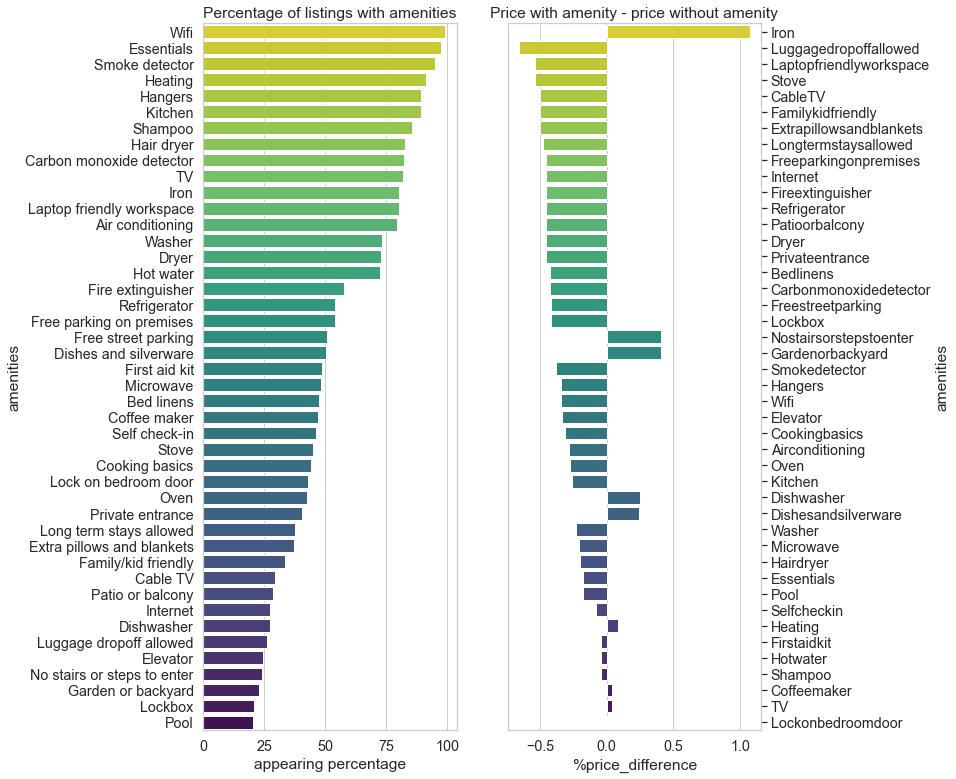

In [143]:
# plot the distribution of amenity type, and the price difference
figsize = (10, 13)
fig = plt.figure(figsize = figsize)
ax = fig.add_subplot(1, 2, 1) 
ax = sns.barplot(x='appearing percentage', y='amenities', data=df_important_amenities, ax=ax, palette="viridis_r")
ax.set_title('Percentage of listings with amenities')
fig = ax.get_figure()
ax = fig.add_subplot(1, 2, 2)
ax = sns.barplot(x='%price_difference', y='amenities', data=amenities_price, ax=ax, palette='viridis_r')
ax.set_title('Price with amenity - price without amenity')
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")

**Discussion for top 40 amenities versus total price**
From the right graph, it shows the correlation between each amenity with the average price, we observe that:
-	Some uncommon features such as “garden or backyard”, “no stair to enter”, “dishwasher” would add more value in term of price for host. 
-	Iron is very common feature but still add significant price to listings. This could explain by the guests prefer to dress up properly in the expensive city – LA.
-	Other common amenities in common life has become standard for Airbnb listing as they do not add much value to the listings.


## Amenities versus Booking ratio

In [144]:
# calculate the price difference between the listing with specific amenity and listing without amenity
amenities_booking_ratio = pd.DataFrame(data= np.zeros((len(amenities_cols), 2)), 
                        index = amenities_cols, columns = ['booking_ratio_without_amenity', 'booking_ratio_with_amenity'])
for col in amenities_cols:
    booking_ratio_without_amenity = amenities_process_df[amenities_process_df[col] == 0]['booking_ratio'].mean()
    booking_ratio_with_amenity = amenities_process_df[amenities_process_df[col] == 1]['booking_ratio'].mean()
    amenities_booking_ratio.loc[col,'booking_ratio_without_amenity'] = booking_ratio_without_amenity
    amenities_booking_ratio.loc[col,'booking_ratio_with_amenity'] = booking_ratio_with_amenity
    amenities_booking_ratio.loc[col,'booking_ratio_difference'] = booking_ratio_with_amenity - booking_ratio_without_amenity
    amenities_booking_ratio.loc[col,'%booking_ratio_difference'] = (booking_ratio_with_amenity - booking_ratio_without_amenity)/booking_ratio_without_amenity
    amenities_booking_ratio.loc[col,'%booking_abs_difference'] = np.abs((booking_ratio_with_amenity - booking_ratio_without_amenity)/booking_ratio_without_amenity)
amenities_booking_ratio = amenities_booking_ratio.sort_values(by='%booking_abs_difference', ascending = False)

In [145]:
amenities_booking_ratio['amenities'] = amenities_booking_ratio.index
amenities_booking_ratio.reset_index(drop = True, inplace=True)
amenities_booking_ratio

,booking_ratio_without_amenity,booking_ratio_with_amenity,booking_ratio_difference,%booking_ratio_difference,%booking_abs_difference,amenities
0,52.307463,0.0,-52.307463,-1.000000,1.000000,Hotwater
1,52.307463,0.0,-52.307463,-1.000000,1.000000,Gardenorbackyard
2,52.307463,0.0,-52.307463,-1.000000,1.000000,Microwave
3,52.307458,1.0,-51.307458,-0.980882,0.980882,Pool
4,52.307458,1.0,-51.307458,-0.980882,0.980882,Hairdryer
5,52.307458,1.0,-51.307458,-0.980882,0.980882,Nostairsorstepstoenter
6,52.307453,2.0,-50.307453,-0.961765,0.961765,Familykidfriendly
7,52.307453,2.0,-50.307453,-0.961765,0.961765,Extrapillowsandblankets
8,52.307444,4.0,-48.307444,-0.923529,0.923529,Elevator
9,52.307444,4.0,-48.307444,-0.923529,0.923529,Longtermstaysallowed


D:\Softwares\Anaconda\lib\site-packages\plotly\matplotlylib\mpltools.py:368: MatplotlibDeprecationWarning:


The is_frame_like function was deprecated in Matplotlib 3.1 and will be removed in 3.3.

D:\Softwares\Anaconda\lib\site-packages\plotly\matplotlylib\renderer.py:547: UserWarning:

Looks like the annotation(s) you are trying 
to draw lies/lay outside the given figure size.

Therefore, the resulting Plotly figure may not be 
large enough to view the full text. To adjust 
the size of the figure, use the 'width' and 
'height' keys in the Layout object. Alternatively,
use the Margin object to adjust the figure's margins.



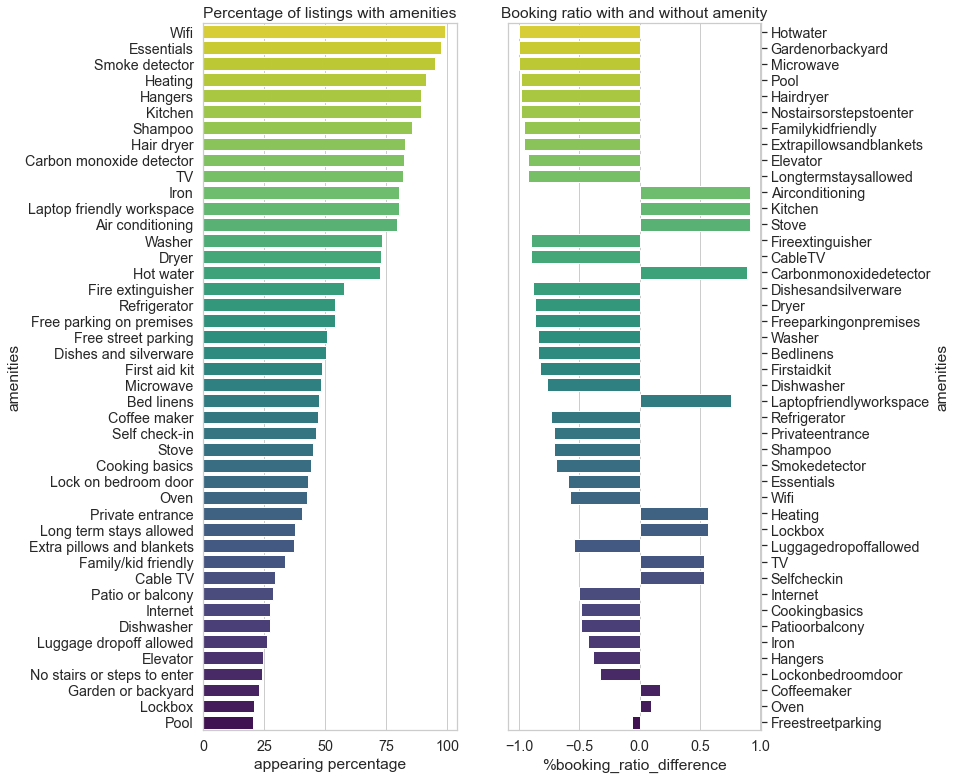

In [146]:
figsize = (10, 13)
fig = plt.figure(figsize = figsize)
ax = fig.add_subplot(1, 2, 1) 
ax = sns.barplot(x='appearing percentage', y='amenities', data=df_important_amenities, ax=ax, palette="viridis_r")
ax.set_title('Percentage of listings with amenities')
fig = ax.get_figure()
ax = fig.add_subplot(1, 2, 2)
ax = sns.barplot(x='%booking_ratio_difference', y='amenities', data=amenities_booking_ratio, ax=ax, palette='viridis_r')
ax.set_title('Booking ratio with and without amenity')
ax.yaxis.tick_right()
ax.yaxis.set_label_position("right")

From the graph show the correlation between each amenity with the booking rate, we observe that:
-	The feature that make guests feel like home (Kitchen, Stove, Heating, TV) and provide modern life comfort (Air conditioning, C02 detector, Laptop work space, Self-check in) such as “Kitchen”, “Air conditioning”, “Stove”, “Laptop workplace” etc. will increase the book rate of a listings. 
-	Other amenities do not add significant value to the book rate due to the popularity of them. In other words, these amenities have become standard for a listing.


## Tourist destinations, Restaurants, hospitals, and grocery stores according to neighborhoods in LA

In [147]:
from folium.plugins import MarkerCluster

LA_lat = 34.052235
LA_long = -118.243683


def los_angeles_map_cluster(df, df_sub, geo_data, cols, key_on, title, legend):
    """
    Return an Interactive choropleth map of Los Angeles boroughs with some of the top Los Angeles attractions mark on the map
    Argument
    ========
    geo_data: geojson coordinate data
    df: pandas dataframe of Los Angeles borough data
    col: the columns of data to be bound.
    key_on: Variable in the geo_data GeoJSON file to bind the data to.
    legend: str, Title for data legend.
    Returns
    ========
    folium map object
    """
    la_map = folium.Map(location=[LA_lat, LA_long], zoom_start=10, tiles='Stamen Toner')
    location = df_sub[['lat', 'long']]
    MarkerCluster(location).add_to(la_map)
    folium.Choropleth(geo_data=geo_data,
                      name='choropleth',
                      data=df,
                      columns=cols,
                      key_on=key_on,
                      fill_color='Set3',
                      fill_opacity=0.6,
                      line_opacity=0.6,
                      title = title,
                      legend_name=legend,
                      bins=7).add_to(la_map)
    title_html = f'''
         <h3 align="center" style="font-size:14px"><b>{title}</b></h3>
         '''
    la_map.get_root().html.add_child(folium.Element(title_html))
    folium.LayerControl().add_to(la_map)

    return la_map

In [148]:
def distance(lat1, lat2, lon1, lon2): 
      
    # The math module contains a function named 
    # radians which converts from degrees to radians. 
    lon1 = radians(lon1) 
    lon2 = radians(lon2) 
    lat1 = radians(lat1) 
    lat2 = radians(lat2) 
       
    # Haversine formula  
    dlon = lon2 - lon1  
    dlat = lat2 - lat1 
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
  
    c = 2 * asin(sqrt(a))  
     
    # Radius of earth in kilometers. Use 3956 for miles 
    r = 6371
       
    # calculate the result 
    return(c * r)

In [149]:
def clean_df_location(df):
    lat=[]
    long=[]
    lat_main =df['lat'].tolist()
    long_main = df['long'].tolist()
    for m in range(len(df['lat'].tolist())):
        d = distance(lat_main[m], LA_lat, long_main[m], LA_long)
        if d <110:
            lat.append(lat_main[m])
            long.append(long_main[m])
    new_df = pd.DataFrame({"lat":lat,"long":long})
    return new_df

In [150]:
lat=[]
long=[]
for l in df_LA_restaurants['LOCATION'].tolist():
    if str(l)!='nan' and str(l)!="(0.0, 0.0)":
        l= str(l).replace("(","").replace(")","")
        lati = float(l.split(",")[0])
        longi= float(l.split(",")[1])
        lat.append(lati)
        long.append(longi)
restaurants_df = pd.DataFrame({"lat":lat,"long":long})

In [151]:
df_LA_destinations_clean = clean_df_location(df_LA_destinations)
df_LA_hospitals_clean = clean_df_location(df_LA_hospitals)
df_LA_groceries_clean = clean_df_location(df_LA_groceries)
df_LA_restaurant_clean = clean_df_location(restaurants_df)

In [152]:
price_col = ['neighbourhood_cleansed', 'mean_price']

In [153]:
price_la_map_tourist_destination = los_angeles_map_cluster(
    mean_price_neighborhood_df,
    df_LA_destinations_clean,
    la_geo,
    price_col,
    key_on='feature.properties.name',
    title=
    'Graphical map illustrate the number of tourist destination near/in neighbourhoods of LA',
    legend='Mean Price')

price_la_map_tourist_destination

In [154]:
price_la_map_hospital = los_angeles_map_cluster(
    mean_price_neighborhood_df,
    df_LA_hospitals_clean,
    la_geo,
    price_col,
    key_on='feature.properties.name',
     title = 'Graphical map illustrate the number of hospitals near/in neighbourhoods of LA',
    legend='Mean Price')

price_la_map_hospital

In [155]:
price_la_map_restaurant = los_angeles_map_cluster(
    mean_price_neighborhood_df,
    df_LA_restaurant_clean,
    la_geo,
    price_col,
    key_on='feature.properties.name',
    title = 'Graphical map illustrate the number of restaurants near/in neighbourhoods of LA',
    legend='Mean Price')

price_la_map_restaurant

In [156]:
price_la_map_groceries = los_angeles_map_cluster(
    mean_price_neighborhood_df,
    df_LA_groceries_clean,
    la_geo,
    price_col,
    key_on='feature.properties.name',
    title = 'Graphical map illustrate the number of grocery stores near/in neighbourhoods of LA',
    legend='Mean Price')

price_la_map_groceries

## Classify language according to the reviews in each neighbourhood in Los Angeles

In [157]:
lang_by_neigbourhood = pd.read_csv('../Data/lang_byneigbourhood.csv', low_memory=False)

In [158]:
lang_by_neigbourhood['dominent_lang'] = [
    i.replace("{","").replace("}","").split(',')[0].split(":")[0].replace("'", "")
    for i in lang_by_neigbourhood['langval']
]

In [159]:
setlang =list(set(lang_by_neigbourhood['dominent_lang'].tolist()))

In [160]:
setlang.sort()
setlang

['de', 'es', 'fr', 'ko', 'pt', 'ro', 'zh-cn']

In [161]:
lang_by_neigbourhood['dominent_lang'].value_counts()

fr       63
es       29
zh-cn     8
de        8
ko        2
pt        1
ro        1
Name: dominent_lang, dtype: int64

In [162]:
_dict = {range(len(setlang))[i]*10: setlang[i] for i in range(len(setlang))}
_dict_map = {v: k for k, v in _dict.items()}
lang_by_neigbourhood['langvalue']=lang_by_neigbourhood['dominent_lang'].map(_dict_map)
_dict

{0: 'de', 10: 'es', 20: 'fr', 30: 'ko', 40: 'pt', 50: 'ro', 60: 'zh-cn'}

In [163]:
from branca.element import Template, MacroElement
template="""
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 1);
     border-radius:6px; padding: 10px; font-size:14px; right: 47px; top: 10px; width:20%'>
     
<div class='legend-title'>Language</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:#8DD3C7;opacity:0.6;'></span>German</li>
    <li><span style='background:#FFFFB3;opacity:0.6;'></span>Spanish</li>
    <li><span style='background:#BEBADA;opacity:0.6;'></span>French </li>
    <li><span style='background:#FB8072;opacity:0.6;'></span>Korean</li>
    <li><span style='background:#80B1D3;opacity:0.6;'></span>Portuguese  </li>
    <li><span style='background:#FDB462;opacity:0.6;'></span>Romanian</li>
    <li><span style='background:#B3DE69;opacity:0.6;'></span>Chinese</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

In [164]:
def los_angeles_map_dominent_(df, geo_data, cols, key_on, title):
    """
    Return an Interactive choropleth map of Los Angeles boroughs with some of the top Los Angeles attractions mark on the map
    Argument
    ========
    geo_data: geojson coordinate data
    df: pandas dataframe of Los Angeles borough data
    col: the columns of data to be bound.
    key_on: Variable in the geo_data GeoJSON file to bind the data to.
    legend: str, Title for data legend.
    Returns
    ========
    folium map object
    """
    LA_lat = 34.052235
    LA_long = -118.243683
    
    la_map = folium.Map(location=[LA_lat, LA_long], zoom_start=10,tiles='Stamen Toner')
    la_map.get_root().add_child(macro)
    choropleth = folium.Choropleth(
        geo_data=geo_data,
        name='choropleth',
        data=df,
        columns=cols,
        key_on=key_on,
        fill_color='Set3',
        fill_opacity=0.8,
        line_opacity=0.3,
        bins=7,
    ).add_to(la_map)
    
    title_html = f'''
         <h3 align="center" style="font-size:14px"><b>{title}</b></h3>
         '''
    la_map.get_root().html.add_child(folium.Element(title_html))
    folium.LayerControl().add_to(la_map)
    
    # Delete color_map of the legend in the cheropleth
    for key in choropleth._children:
        if key.startswith('color_map'):
            del(choropleth._children[key])
    
    return la_map

In [165]:
lang_col = ['neigbourhood', 'langvalue']
lang_la_map = los_angeles_map_dominent_(lang_by_neigbourhood,
                                        la_geo,
                                        lang_col,
                                        key_on='feature.properties.name', 
                                        title='Distribution of dominent languages in each neighbourhood')
        
lang_la_map

In [166]:
import ast 

def get_key(val,dict_): 
    for key, value in dict_.items(): 
         if key == val: 
            return value 
    return 0

def filter_lang(df,lang):
    lang_val = []
    for i,r in df.iterrows():
        dict_=ast.literal_eval( r['langval'])
        value = get_key(lang,dict_)
        lang_val.append(value)
    df[lang]=lang_val

In [167]:
for j in setlang:
    filter_lang(lang_by_neigbourhood,j)

In [168]:
german_distribution_la_map = los_angeles_map_plotly(
    lang_by_neigbourhood,
    geo_data=la_geo,
    col_locations='neigbourhood',
    col_color='de',
    color_scale='sunsetdark',
    title='Graphical map illustrates the distribution of Germany language by neighbourhood according to reviews'
)
iplot(german_distribution_la_map, validate=False, filename='Distribution of Germany language at each neighbourhood in Los Angeles')

In [169]:
spanish_distribution_la_map = los_angeles_map_plotly(
    lang_by_neigbourhood,
    geo_data=la_geo,
    col_locations='neigbourhood',
    col_color='es',
    color_scale='sunsetdark',
    title='Graphical map illustrates the distribution of Spanish language by neighbourhood according to reviews'
)
iplot(spanish_distribution_la_map, validate=False, filename='Distribution of Spanish language at each neighbourhood in Los Angeles')

In [170]:
korean_distribution_la_map = los_angeles_map_plotly(
    lang_by_neigbourhood,
    geo_data=la_geo,
    col_locations='neigbourhood',
    col_color='ko',
    color_scale='sunsetdark',
    title='Graphical map illustrates the distribution of Korean language by neighbourhood according to reviews'
)
iplot(korean_distribution_la_map, validate=False, filename='Distribution of Korean language at each neighbourhood in Los Angeles')

In [171]:
french_distribution_la_map = los_angeles_map_plotly(
    lang_by_neigbourhood,
    geo_data=la_geo,
    col_locations='neigbourhood',
    col_color='fr',
    color_scale='sunsetdark',
    title='Graphical map illustrates the distribution of French language by neighbourhood according to reviews'
)
iplot(french_distribution_la_map, validate=False, filename='Distribution of French language at each neighbourhood in Los Angeles')

In [172]:
portuguese_distribution_la_map = los_angeles_map_plotly(
    lang_by_neigbourhood,
    geo_data=la_geo,
    col_locations='neigbourhood',
    col_color='pt',
    color_scale='sunsetdark',
    title='Graphical map illustrates the distribution of Portuguese language by neighbourhood according to reviews'
)
iplot(portuguese_distribution_la_map, validate=False, filename='Distribution of Portuguese language at each neighbourhood in Los Angeles')

In [173]:
mandarin_cantonese_distribution_la_map = los_angeles_map_plotly(
    lang_by_neigbourhood,
    geo_data=la_geo,
    col_locations='neigbourhood',
    col_color='zh-cn',
    color_scale='sunsetdark',
    title='Graphical map illustrates the distribution of Cantonese and Madarin language by neighbourhood according to reviews'
)
iplot(mandarin_cantonese_distribution_la_map, validate=False, filename='Distribution of Cantonese and Madarin language at each neighbourhood in Los Angeles')